In [1]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr, f_oneway
import warnings
from tqdm import tqdm
from scipy.spatial import distance_matrix

from bin import utils

warnings.simplefilter('ignore')

In [2]:
fdata = sc.read_h5ad('../20240502-SPACseq/RNA/Multitime.clustered.h5')
gdata = sc.read_h5ad('../20240502-SPACseq/RNA/Multitime.filtered.guide.bin100.h5')
annotation = sc.read_h5ad('../20240502-SPACseq/RNA/Multitime.annotation.h5')

In [3]:
annotation.obs['coord_x'] = annotation.obsm['spatial'][:, 0] // 100 * 100
annotation.obs['coord_y'] = annotation.obsm['spatial'][:, 1] // 100 * 100

In [4]:
def align_gdata_filtered(fdata, gdata, bin_size=100):
    gdata.obs.marker = gdata.obs.marker.map({
        'B926-1': '2-1',
        'B926-2': '2-2',
        'B924-1': '1-1',
        'B924-2': '1-2',
        'B922-1': '3-1',
        'B922-2': '3-2'
    })
    fdata.obs['coord_x'] = fdata.obsm['spatial'][:, 0] // bin_size * bin_size
    fdata.obs['coord_y'] = fdata.obsm['spatial'][:, 1] // bin_size * bin_size

    gdata.obs['coord_x'] = gdata.obsm['spatial'][:, 0] // bin_size * bin_size
    gdata.obs['coord_y'] = gdata.obsm['spatial'][:, 1] // bin_size * bin_size
    fdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(fdata.obs['marker'], fdata.obs['coord_x'], fdata.obs['coord_y'])]
    gdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(gdata.obs['marker'], gdata.obs['coord_x'], gdata.obs['coord_y'])]

    common_bins = np.intersect1d(fdata.obs_names, gdata.obs_names)
    fdata = fdata[common_bins].copy()
    gdata = gdata[common_bins].copy()
    return fdata, gdata

fdata, gdata = align_gdata_filtered(fdata, gdata)

In [5]:
gdata = utils.combine_guide_replicates(gdata)

In [6]:
gdata.obs['cluster'] = fdata.obs.cluster_cellcharter_givenk

# Unbiased Correlation

In [80]:
hallmark_file = open('../20240502-SPACseq/GO/mh.all.v2023.2.Mm.symbols.gmt', 'r')
hallmark_dict = {}
for line in hallmark_file:
    line = line.rstrip('\n')
    hallmark_name = line.split('\t')[0].lstrip('HALLMARK')[1:]
    hallmark_genes = line.split('\t')[2:]
    hallmark_dict[hallmark_name] = hallmark_genes

In [81]:
for hallmark in hallmark_dict:
    print(hallmark)
    sc.tl.score_genes(fdata, hallmark_dict[hallmark], score_name=f'{hallmark}_score')

ADIPOGENESIS
ALLOGRAFT_REJECTION
ANDROGEN_RESPONSE
ANGIOGENESIS
APICAL_JUNCTION
APICAL_SURFACE
APOPTOSIS
BILE_ACID_METABOLISM
CHOLESTEROL_HOMEOSTASIS
COAGULATION
COMPLEMENT
DNA_REPAIR
E2F_TARGETS
EPITHELIAL_MESENCHYMAL_TRANSITION
ESTROGEN_RESPONSE_EARLY
ESTROGEN_RESPONSE_LATE
FATTY_ACID_METABOLISM
G2M_CHECKPOINT
GLYCOLYSIS
HEDGEHOG_SIGNALING
HEME_METABOLISM
HYPOXIA
IL2_STAT5_SIGNALING
IL6_JAK_STAT3_SIGNALING
INFLAMMATORY_RESPONSE
INTERFERON_ALPHA_RESPONSE
INTERFERON_GAMMA_RESPONSE
KRAS_SIGNALING_DN
KRAS_SIGNALING_UP
MITOTIC_SPINDLE
MTORC1_SIGNALING
MYC_TARGETS_V1
MYC_TARGETS_V2
MYOGENESIS
NOTCH_SIGNALING
OXIDATIVE_PHOSPHORYLATION
P53_PATHWAY
PANCREAS_BETA_CELLS
PEROXISOME
PI3K_AKT_MTOR_SIGNALING
PROTEIN_SECRETION
REACTIVE_OXIGEN_SPECIES_PATHWAY
SPERMATOGENESIS
TGF_BETA_SIGNALING
TNFA_SIGNALING_VIA_NFKB
UNFOLDED_PROTEIN_RESPONSE
UV_RESPONSE_DN
UV_RESPONSE_UP
WNT_BETA_CATENIN_SIGNALING
XENOBIOTIC_METABOLISM


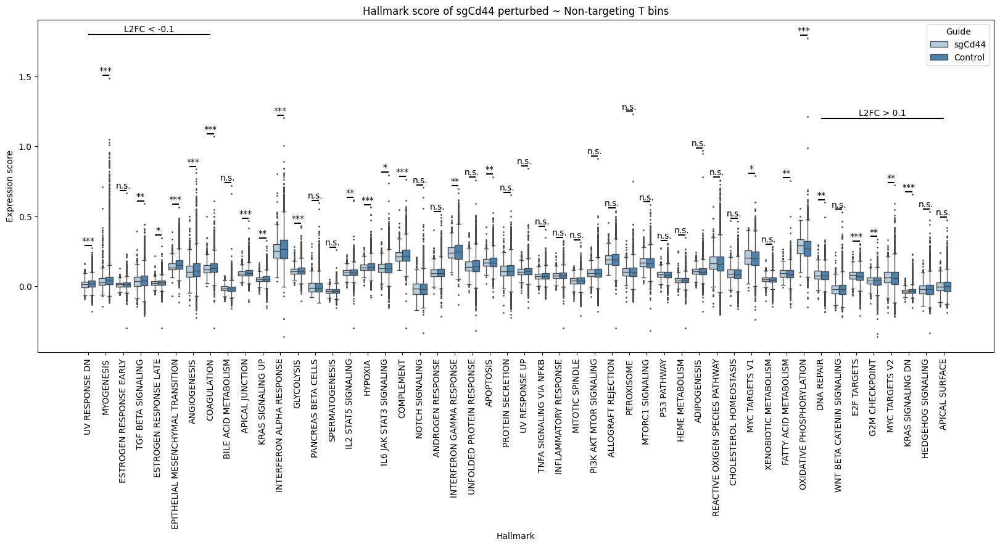

In [121]:
cd44_data = fdata[gdata[:, 'sgCd44'].X > 0].obs.loc[:, fdata.obs.columns.str.endswith('score')].melt()
ntc_data = fdata[gdata[:, 'sgnon-targeting'].X > 0].obs.loc[:, fdata.obs.columns.str.endswith('score')].melt()

cd44_data['Guide'] = 'sgCd44'
ntc_data['Guide'] = 'Control'
p_df = pd.concat([cd44_data, ntc_data])
plt.figure(figsize=(20, 7))

l2fc_dict = {}
for hallmark in hallmark_dict:
    l2fc_dict[f'{hallmark}_score'] = np.log2(np.mean(cd44_data.loc[cd44_data.variable == f'{hallmark}_score', 'value']) /\
        np.mean(ntc_data.loc[ntc_data.variable == f'{hallmark}_score', 'value']))
x_order = pd.DataFrame(l2fc_dict, index=['l2fc']).T.sort_values(by='l2fc').index.tolist()

for idx, hallmark in enumerate(x_order):
    p_value = f_oneway(cd44_data.loc[cd44_data.variable == hallmark, 'value'],
        ntc_data.loc[ntc_data.variable == hallmark, 'value'])[1]
    y_start = max([max(cd44_data.loc[cd44_data.variable == hallmark, 'value']),
        max(ntc_data.loc[ntc_data.variable == hallmark, 'value'])]) + 0.02
    plt.hlines(y=y_start, xmin=idx-0.2, xmax=idx+0.2, color='black')
    plt.text(idx, y_start + 0.015, (lambda p: '***' if p < 0.001 else ('**' if p < 0.01 else ('*' if p < 0.05 else 'n.s.')))(p_value), ha='center')

sns.boxplot(p_df, x='variable', y='value', hue='Guide', order=x_order, palette='Blues', fliersize=1)

plt.hlines(xmin=0, xmax=7, y=1.8, color='black')
plt.text(3.5, 1.82, 'L2FC < -0.1', ha='center')

plt.hlines(xmin=42, xmax=49, y=1.2, color='black')
plt.text(45.5, 1.22, 'L2FC > 0.1', ha='center')

plt.xticks(list(range(len(hallmark_dict.keys()))), [x.rstrip('_score').replace('_', ' ') for x in x_order], rotation=90)
plt.title('Hallmark score of sgCd44 perturbed ~ Non-targeting T bins')
plt.ylabel('Expression score')
plt.xlabel('Hallmark')
plt.show()

# sgCd44 distribution in clusters

/tmp/ipykernel_24384/4054826426.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cdf = cdf.groupby(['marker', 'cluster']).sum().unstack()
/tmp/ipykernel_24384/4054826426.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(pdf, x='cluster', y='value', palette='RdBu_r')


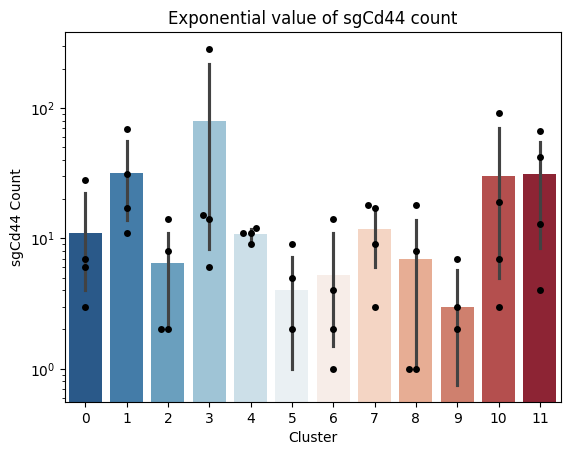

In [191]:
cdf = pd.concat([pd.DataFrame(gdata[:, 'sgCd44'].X.toarray().flatten(), index=gdata.obs_names, columns=['sgCd44']), gdata.obs[['marker', 'cluster']]], axis=1)
cdf = cdf.groupby(['marker', 'cluster']).sum().unstack()

pdf = pd.concat([cdf.iloc[2:].melt().iloc[:, 1:].reset_index(drop=True), pd.DataFrame(['1-1', '1-2', '2-1', '2-2'] * 12)], axis=1)
# pdf = pd.concat([cdf.iloc[0:].melt().iloc[:, 1:].reset_index(drop=True), pd.DataFrame(['3-1', '3-2', '1-1', '1-2', '2-1', '2-2'] * 12)], axis=1)
sns.barplot(pdf, x='cluster', y='value', palette='RdBu_r')
sns.swarmplot(pdf, x='cluster', y='value', color='black')
# plt.legend(bbox_to_anchor=(1.0, 1))
plt.xlabel('Cluster')
plt.ylabel('sgCd44 Count')
plt.title('Exponential value of sgCd44 count')
plt.gca().set_yscale('log')

/tmp/ipykernel_24384/466242420.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cdf = cdf.groupby(['marker', 'cluster']).sum().unstack()


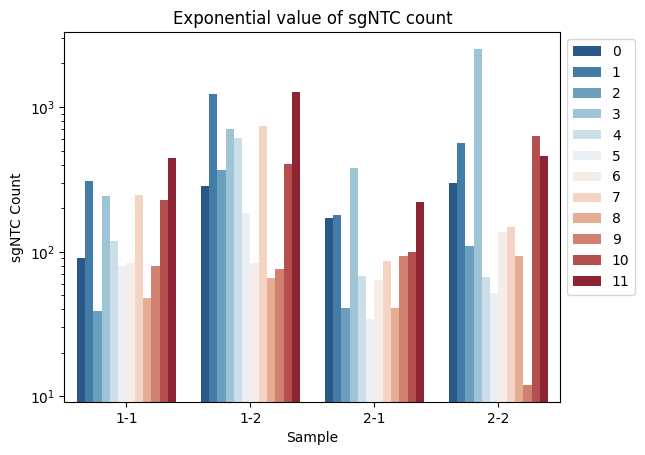

In [173]:
cdf = pd.concat([pd.DataFrame(gdata[:, 'sgnon-targeting'].X.toarray().flatten(), index=gdata.obs_names, columns=['sgCd44']), gdata.obs[['marker', 'cluster']]], axis=1)
cdf = cdf.groupby(['marker', 'cluster']).sum().unstack()

pdf = pd.concat([cdf.iloc[2:].melt().iloc[:, 1:].reset_index(drop=True), pd.DataFrame(['1-1', '1-2', '2-1', '2-2'] * 12)], axis=1)
sns.barplot(pdf, x=0, y='value', hue='cluster', palette='RdBu_r')
plt.legend(bbox_to_anchor=(1.0, 1))
plt.xlabel('Sample')
plt.ylabel('sgNTC Count')
plt.title('Exponential value of sgNTC count')
plt.gca().set_yscale('log')

# T cell bins score distribution

  0%|          | 0/13 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:28<00:00,  2.20s/it]


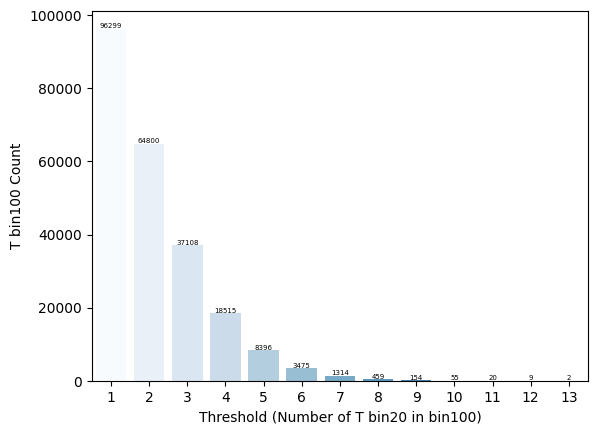

In [7]:
thresholds = range(13)
t_cnt = {}
for threshold in tqdm(thresholds):
    df = (annotation[annotation.obs.annotations.str.endswith('T')].obs.groupby(['marker', 'coord_x', 'coord_y']).count().unstack().unstack() > threshold)['annotations'].melt(ignore_index=False).reset_index()
    # mask = gdata.obs.join(df.set_index(['marker', 'coord_x', 'coord_y']), on=['marker', 'coord_x', 'coord_y']).value.tolist()
    t_cnt[threshold] = df.value.sum()
df = pd.DataFrame(t_cnt, index=['T bin100 Count']).T.reset_index()
sns.barplot(df, x='index', y='T bin100 Count', hue='index', palette='Blues', legend=False)
plt.xlabel('Threshold (Number of T bin20 in bin100)')
for i in range(13):
    plt.text(i, t_cnt[i] + 200, t_cnt[i], ha='center', size=5)
plt.xticks(range(13), range(1, 14))
plt.show()

In [17]:
gdata = sc.read_h5ad('../20240502-SPACseq/RNA/Multitime.filtered.guide.bin100.h5')
gdata_s = sc.read_h5ad('../20240502-SPACseq/RNA/Multitime.guide.h5')

In [24]:
gdata.obs['T_marker'] = fdata[:, ['Cd3d', 'Cd3e', 'Cd3g', 'Cd8a', 'Cd8b1']].X.sum(axis=1)

In [48]:
t_cnt = {}
for threshold in np.linspace(0, np.quantile(gdata.obs['T_marker'], 0.95), 20):
    t_cnt[threshold] = (gdata.obs['T_marker'] > threshold).sum()

In [34]:
annotation[annotation.obs.annotations.str.endswith('T')].obs.groupby(['marker', 'coord_x', 'coord_y']).count().unstack().unstack()

annotations                                                        \
coord_y       0                                                             
coord_x       0     100   200   300   400   500   600   700   800   900     
marker                                                                      
1-1               0     1     1     1     2     1     0     0     1     1   
1-2               0     0     0     0     0     0     0     0     0     0   
2-1               0     0     0     0     0     0     0     0     0     0   
2-2               0     0     0     0     0     0     0     0     0     0   
3-1               0     0     0     0     0     0     0     0     0     0   
3-2               0     0     0     0     0     0     0     0     0     0   

         ...                                                              
coord_y  ... 18100                                                        
coord_x  ... 17900 18000 18100 18200 18300 18400 18500 18600 18700 18800  
marker   ...                                                              
1-1      ...     0     0     0     0     0     0     0     0     0     0  
1-2      ...     0     0     0     0     0     0     0     0     0     0  
2-1      ...     0     0     0     0     0     0     0     0     0     0  
2-2      ...     0     0     0     0     0     0     0     0     0     0  
3-1      ...     0     0     0     0     0     0     0     0     0     0  
3-2      ...     0     0     0     0     0     0     0     0     0     0  

[6 rows x 34398 columns]

In [16]:
proportion_rand = {}
for marker in gdata.obs.marker.unique():
    gdata_ = gdata[gdata.obs['marker'] == marker]
    random_cnt = 10000
    proportion_rand[marker] = []
    for threshold in tqdm(np.linspace(1, 501, 20)):
        cnt = random_cnt
        random_bins = np.random.choice(gdata_.obs_names, cnt, replace=False)
        ntc_data = gdata_[gdata_[:, 'sgnon-targeting'].X > 2].copy()
        in_distance = ((distance_matrix(gdata_[random_bins].obsm['spatial'], ntc_data.obsm['spatial']) < threshold).sum(axis=1) > 0).sum()
        proportion_rand[marker].append(in_distance / cnt)

776887

In [303]:
df = (annotation[annotation.obs.annotations.str.endswith('T')].obs.groupby(['marker', 'coord_x', 'coord_y']).count().unstack().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask = gdata.obs.join(df.set_index(['marker', 'coord_x', 'coord_y']), on=['marker', 'coord_x', 'coord_y']).value.tolist()

In [167]:
gdata_ = gdata[(gdata.obs.marker == '2-1') & mask].copy()
fdata_ = fdata[(fdata.obs.marker == '2-1') & mask].copy()

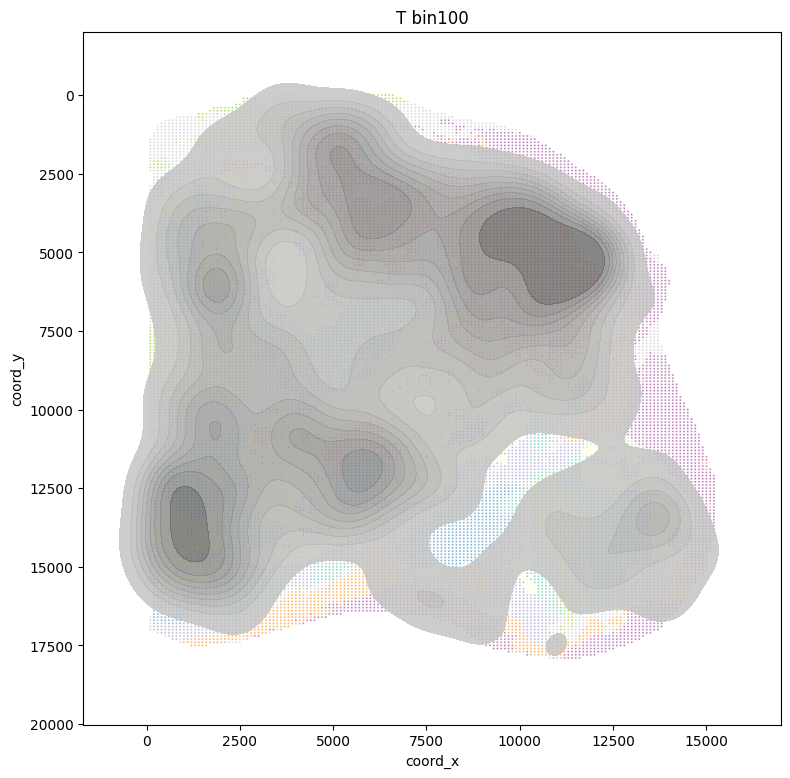

In [169]:
plt.figure(figsize=(9, 9))
plt.title('T bin100')
sns.scatterplot(gdata[gdata.obs.marker == '2-1'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False)
sns.kdeplot(x=gdata_.obsm['spatial'][:, 0], y=gdata_.obsm['spatial'][:, 1], hue=[0] * len(gdata_.obsm['spatial']),
    palette='Greys', fill=True, bw_adjust=0.5, alpha=0.8, legend=False)
plt.gca().invert_yaxis()

In [376]:
T_marker = {
    "memory T": ['Cd8a','Cd8b1', "Il7r", "Cd27", 'Ccr4','Eomes','Gpr183'],
    "effector T": ['Cd8a','Cd8b1', 'Cd69','Ifng', 'Gzme', 'Gzmf', 'Gzmn', 'Gzmd', 'Gzmg', "Gzmk", "Gzma", "Gzmb", "Prf1", "Nkg7"],
    "exhausted T": ['Cd8a','Cd8b1', "Lag3", "Pdcd1", "Tigit", "Ctla4", 'Tox', 'Sirpb1b', 'Sirpb1a', 'Sirpa','Tnfrsf9','Tnfrsf18',  'Cxcr6', 'Cxcl13'],
    "stem-like T": ["Tcf7", "Foxo1"]
}
# fdata.var_names[fdata.var_names.str.startswith('Fgfbp2')]

In [448]:
for marker in T_marker:
    sc.tl.score_genes(fdata_, T_marker[marker], score_name=f'{marker}_score')

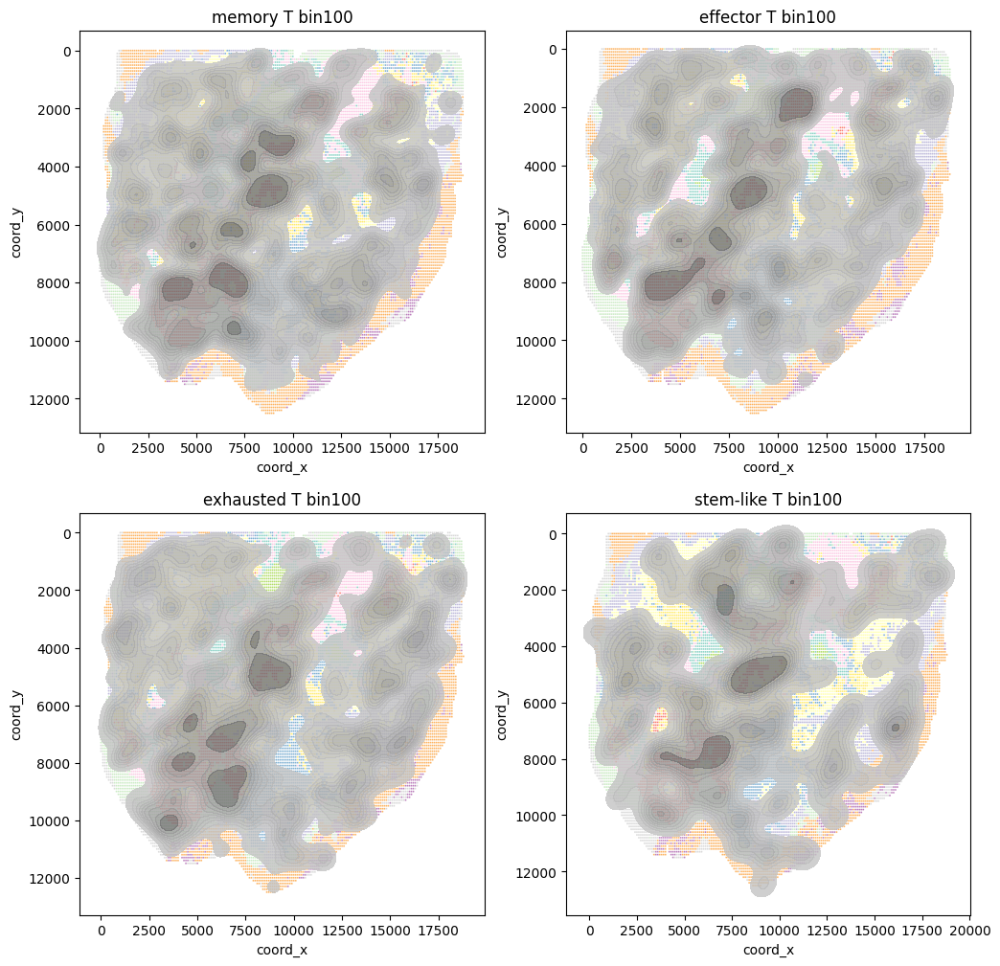

In [449]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
for idx, marker in enumerate(T_marker):
    ax = axs[idx // 2, idx % 2]
    ax.set_title(f'{marker} bin100')
    pdata = fdata_[fdata_.obs[f'{marker}_score'] > 0.1].copy()
    sns.scatterplot(gdata[gdata.obs.marker == '1-2'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', ax=ax, legend=False)
    sns.kdeplot(x=pdata.obsm['spatial'][:, 0], y=pdata.obsm['spatial'][:, 1], hue=[0] * len(pdata.obsm['spatial']), palette='Greys', fill=True, bw_adjust=0.3, alpha=0.8, legend=False, ax=ax)
    ax.invert_yaxis()

In [394]:
np.unique(gdata[:, 'sgCd44'].X)

ArrayView([0, 1, 2])

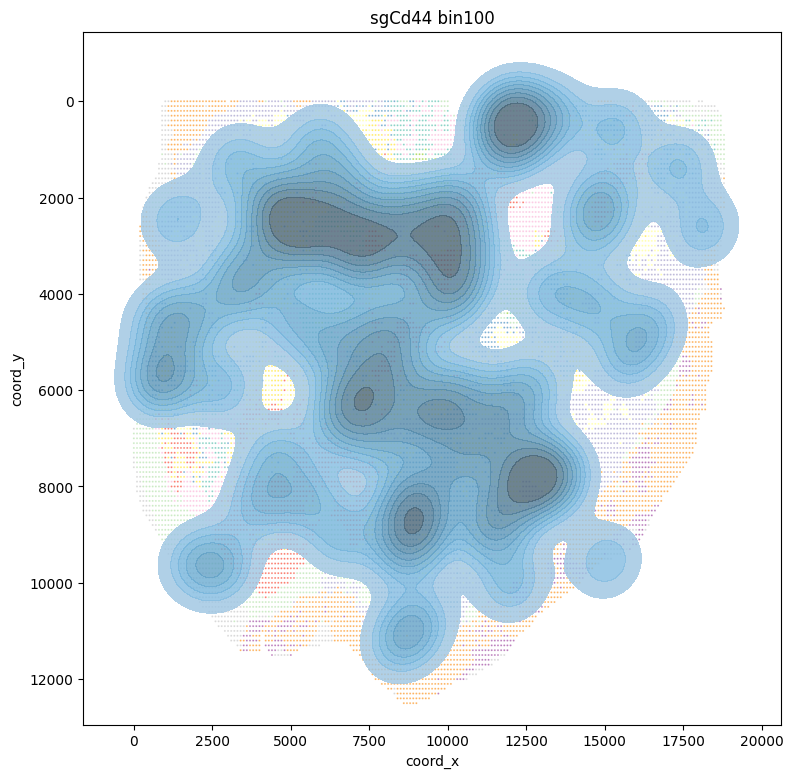

In [451]:
plt.figure(figsize=(9, 9))

pdata = gdata[(gdata.obs.marker == '1-2') & (gdata[:, 'sgCd44'].X.flatten() > 0)].copy()
plt.title('sgCd44 bin100')
sns.scatterplot(gdata[gdata.obs.marker == '1-2'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False)
sns.kdeplot(x=pdata.obsm['spatial'][:, 0], y=pdata.obsm['spatial'][:, 1], hue=[0] * len(pdata.obsm['spatial']), palette='Blues', fill=True, bw_adjust=0.4, alpha=0.8, legend=False)
plt.gca().invert_yaxis()

# Interaction

In [511]:
pdata = gdata[gdata.obs.marker == '2-1'].copy()
sq.gr.spatial_neighbors(pdata, coord_type='generic', delaunay=False, radius=[50, 160], n_neighs=15, set_diag=False, key_added='neighbor')
sq.gr.spatial_neighbors(pdata, coord_type='generic', delaunay=False, radius=[50, 160], n_neighs=15, set_diag=True, key_added='spatial')

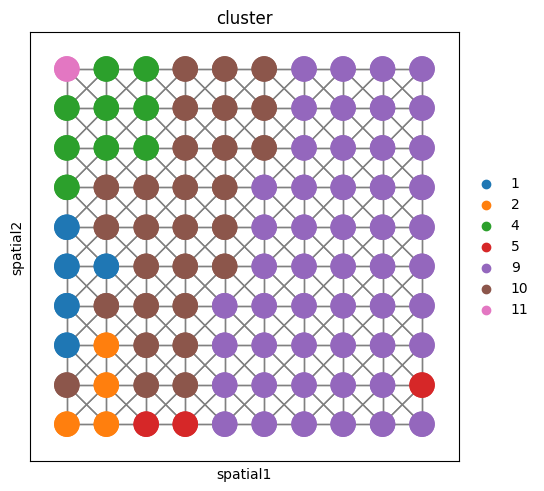

In [512]:
min_x, max_x = 14000, 15000
min_y, max_y = 14000, 15000
plot_data = pdata[(pdata.obsm['spatial'][:, 0] >= min_x) & (pdata.obsm['spatial'][:, 0] <= max_x) &\
    (pdata.obsm['spatial'][:, 1] >= min_y) & (pdata.obsm['spatial'][:, 1] <= max_y)].copy()
sq.pl.spatial_scatter(plot_data, connectivity_key="neighbor_connectivities", na_color="lightgrey", spatial_key='spatial', shape=None, color='cluster')

In [456]:
MARKER = '2-1'

In [462]:
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

In [479]:
mask_sgcd44_t = (gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X > 0).flatten() & mask_t
mask_sgntc_t = (gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X > 0).flatten() & mask_t
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

31 710


In [488]:
df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & mask_macrophage
sum(mask_spp1_macrophage)

6118

In [490]:
df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 5)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & mask_malignant
sum(mask_spp1_malignant)

5700

In [555]:
inter_data = pdata.copy()
inter_data.obs['interact_type'] = 'None'
inter_data.obs['interact_type'][mask_spp1_malignant] = 'Spp1+ Malignant'
inter_data.obs['interact_type'][mask_sgcd44_t] = 'sgCd44 T'
inter_data = inter_data[mask_sgcd44_t | mask_spp1_malignant].copy()
min_x, max_x = -np.inf, np.inf
min_y, max_y = -np.inf, np.inf
plot_data = inter_data[(inter_data.obsm['spatial'][:, 0] >= min_x) & (inter_data.obsm['spatial'][:, 0] <= max_x) &\
    (inter_data.obsm['spatial'][:, 1] >= min_y) & (inter_data.obsm['spatial'][:, 1] <= max_y)].copy()
# sq.pl.spatial_scatter(plot_data, connectivity_key="neighbor_connectivities", na_color="lightgrey", spatial_key='spatial', shape=None, size=10, color='interact_type', figsize=(15, 15))

  0%|          | 0/1000 [00:00<?, ?/s]

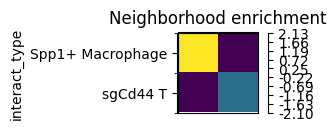

In [529]:
inter_data.obs.interact_type = inter_data.obs.interact_type.astype('category')
sq.gr.nhood_enrichment(inter_data, cluster_key='interact_type', connectivity_key='spatial')
sq.pl.nhood_enrichment(inter_data, cluster_key='interact_type')

In [554]:
inter_data = pdata.copy()
inter_data.obs['interact_type'] = 'None'
inter_data.obs['interact_type'][mask_spp1_macrophage] = 'Spp1+ Macrophage'
inter_data.obs['interact_type'][mask_sgcd44_t] = 'sgCd44 T'
inter_data = inter_data[mask_sgcd44_t | mask_spp1_macrophage].copy()
min_x, max_x = -np.inf, np.inf
min_y, max_y = -np.inf, np.inf
plot_data = inter_data[(inter_data.obsm['spatial'][:, 0] >= min_x) & (inter_data.obsm['spatial'][:, 0] <= max_x) &\
    (inter_data.obsm['spatial'][:, 1] >= min_y) & (inter_data.obsm['spatial'][:, 1] <= max_y)].copy()
# sq.pl.spatial_scatter(plot_data, connectivity_key="neighbor_connectivities", na_color="lightgrey", spatial_key='spatial', shape=None, size=10, color='interact_type', figsize=(15, 15))

  0%|          | 0/1000 [00:00<?, ?/s]

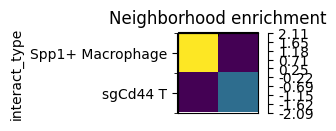

In [536]:
inter_data.obs.interact_type = inter_data.obs.interact_type.astype('category')
sq.gr.nhood_enrichment(inter_data, cluster_key='interact_type', connectivity_key='spatial')
sq.pl.nhood_enrichment(inter_data, cluster_key='interact_type')

In [558]:
inter_data = pdata.copy()
inter_data.obs['interact_type'] = 'None'
inter_data.obs['interact_type'][mask_spp1_macrophage] = 'Spp1+ Macrophage'
inter_data.obs['interact_type'][mask_spp1_malignant] = 'Spp1+ Malignant'
inter_data.obs['interact_type'][mask_sgntc_t] = 'Control T'
inter_data.obs['interact_type'][mask_sgcd44_t] = 'sgCd44 T'
inter_data = inter_data[mask_sgcd44_t | mask_spp1_macrophage | mask_sgntc_t | mask_spp1_malignant].copy()
min_x, max_x = -np.inf, np.inf
min_y, max_y = -np.inf, np.inf
plot_data = inter_data[(inter_data.obsm['spatial'][:, 0] >= min_x) & (inter_data.obsm['spatial'][:, 0] <= max_x) &\
    (inter_data.obsm['spatial'][:, 1] >= min_y) & (inter_data.obsm['spatial'][:, 1] <= max_y)].copy()
# sq.pl.spatial_scatter(plot_data, connectivity_key="neighbor_connectivities", na_color="lightgrey", spatial_key='spatial', shape=None, size=10, color='interact_type', figsize=(15, 15))

  0%|          | 0/1000 [00:00<?, ?/s]

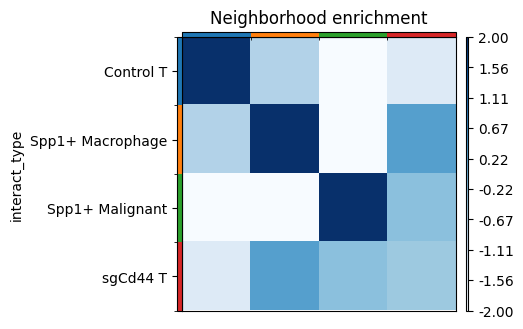

In [559]:
inter_data.obs.interact_type = inter_data.obs.interact_type.astype('category')
sq.gr.nhood_enrichment(inter_data, cluster_key='interact_type', connectivity_key='spatial')
sq.pl.nhood_enrichment(inter_data, cluster_key='interact_type', figsize=(3, 3), vmax=2, vmin=-2, cmap='Blues')

# Distancing

In [571]:
proportion_mac = {}
proportion_mac['Control'] = []
for threshold in tqdm(np.linspace(1, 501, 20)):
    data_1 = pdata[mask_sgntc_t]
    data_2 = pdata[mask_spp1_macrophage]
    in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
    proportion_mac['Control'].append(in_distance / data_1.shape[0])
proportion_mac['sgCd44'] = []
for threshold in tqdm(np.linspace(1, 501, 20)):
    data_1 = pdata[mask_sgcd44_t]
    data_2 = pdata[mask_spp1_macrophage]
    in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
    proportion_mac['sgCd44'].append(in_distance / data_1.shape[0])

100%|██████████| 20/20 [00:00<00:00, 81.42it/s]


In [570]:
proportion_mag = {}
proportion_mag['Control'] = []
for threshold in tqdm(np.linspace(1, 501, 20)):
    data_1 = pdata[mask_sgntc_t]
    data_2 = pdata[mask_spp1_malignant]
    in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
    proportion_mag['Control'].append(in_distance / data_1.shape[0])
proportion_mag['sgCd44'] = []
for threshold in tqdm(np.linspace(1, 501, 20)):
    data_1 = pdata[mask_sgcd44_t]
    data_2 = pdata[mask_spp1_malignant]
    in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
    proportion_mag['sgCd44'].append(in_distance / data_1.shape[0])

100%|██████████| 20/20 [00:00<00:00, 81.90it/s]


In [578]:
pdf

,index,variable,value,cell
0,1.000000,ControlMacrophage,0.338028,Macrophage
1,27.315789,ControlMacrophage,0.338028,Macrophage
2,53.631579,ControlMacrophage,0.338028,Macrophage
3,79.947368,ControlMacrophage,0.338028,Macrophage
4,106.263158,ControlMacrophage,0.770423,Macrophage
...,...,...,...,...
35,395.736842,sgCd44Malignant,0.967742,Malignant
36,422.052632,sgCd44Malignant,0.967742,Malignant
37,448.368421,sgCd44Malignant,1.000000,Malignant
38,474.684211,sgCd44Malignant,1.000000,Malignant


<Axes: xlabel='index', ylabel='value'>

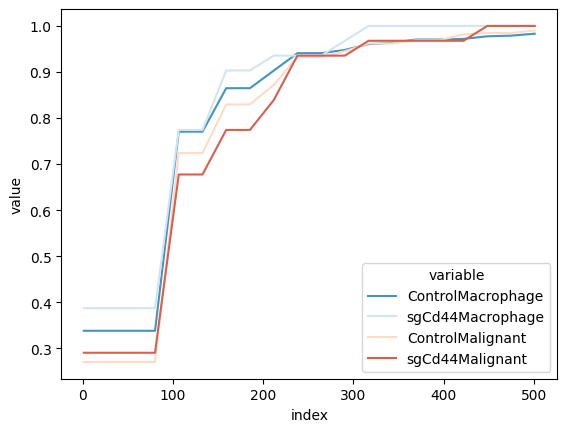

In [577]:
pdf_mac = pd.DataFrame(proportion_mac, index=np.linspace(1, 501, 20)).melt(ignore_index=False).reset_index()
pdf_mac['cell'] = 'Macrophage'
pdf_mag = pd.DataFrame(proportion_mag, index=np.linspace(1, 501, 20)).melt(ignore_index=False).reset_index()
pdf_mag['cell'] = 'Malignant'
pdf = pd.concat([pdf_mac, pdf_mag], axis=0)
pdf.variable = pdf.variable + pdf.cell
sns.lineplot(pdf, x='index', y='value', hue='variable', palette='RdBu_r')

In [602]:
pdf = pd.DataFrame(columns=['index', 'variable', 'value', 'cell'])
for MARKER in ['1-1', '1-2', '2-1', '2-2']:
    pdata = gdata[gdata.obs.marker == MARKER].copy()
    df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
    mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

    mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
    mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
    print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

    df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
    mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
    mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
    print(sum(mask_spp1_macrophage))

    df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 5)['annotations'].melt(ignore_index=False).reset_index()
    mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
    mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
    print(sum(mask_spp1_malignant))

    proportion_mac = {}
    proportion_mac['Control'] = []
    for threshold in tqdm(np.linspace(1, 501, 20)):
        data_1 = pdata[mask_sgntc_t]
        data_2 = pdata[mask_spp1_macrophage]
        in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
        proportion_mac['Control'].append(in_distance / data_1.shape[0])
    proportion_mac['sgCd44'] = []
    for threshold in tqdm(np.linspace(1, 501, 20)):
        data_1 = pdata[mask_sgcd44_t]
        data_2 = pdata[mask_spp1_macrophage]
        in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
        proportion_mac['sgCd44'].append(in_distance / data_1.shape[0])

    proportion_mag = {}
    proportion_mag['Control'] = []
    for threshold in tqdm(np.linspace(1, 501, 20)):
        data_1 = pdata[mask_sgntc_t]
        data_2 = pdata[mask_spp1_malignant]
        in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
        proportion_mag['Control'].append(in_distance / data_1.shape[0])
    proportion_mag['sgCd44'] = []
    for threshold in tqdm(np.linspace(1, 501, 20)):
        data_1 = pdata[mask_sgcd44_t]
        data_2 = pdata[mask_spp1_malignant]
        in_distance = data_1[(distance_matrix(data_1.obsm['spatial'], data_2.obsm['spatial']) < threshold).sum(axis=1) > 0].shape[0]
        proportion_mag['sgCd44'].append(in_distance / data_1.shape[0])

    pdf_mac = pd.DataFrame(proportion_mac, index=np.linspace(1, 501, 20)).melt(ignore_index=False).reset_index()
    pdf_mac['cell'] = 'Macrophage'
    pdf_mag = pd.DataFrame(proportion_mag, index=np.linspace(1, 501, 20)).melt(ignore_index=False).reset_index()
    pdf_mag['cell'] = 'Malignant'
    pdf = pd.concat([pdf, pdf_mac, pdf_mag], axis=0)
pdf.variable = pdf.variable + pdf.cell

62 724
3825
12611


100%|██████████| 20/20 [00:00<00:00, 40.14it/s]


22 1469
137
3866


100%|██████████| 20/20 [00:00<00:00, 195.71it/s]


31 710
6118
5700


100%|██████████| 20/20 [00:00<00:00, 120.13it/s]


349 2415
1233
3489


100%|██████████| 20/20 [00:00<00:00, 25.11it/s]


In [608]:
pdf.variable = pdf.variable.map({
    'ControlMalignant': 'wt T ~ Spp1+ Malignant',
    'sgCd44Malignant': 'sgCd44 T ~ Spp1+ Malignant',
    'ControlMacrophage': 'wt T ~ Spp1+ Macrophage',
    'sgCd44Macrophage': 'sgCd44 T ~ Spp1+ Macrophage' 
})

Text(0.5, 1.0, 'wt/sgCd44 T distance with Spp1+ Malignant - 4 slides')

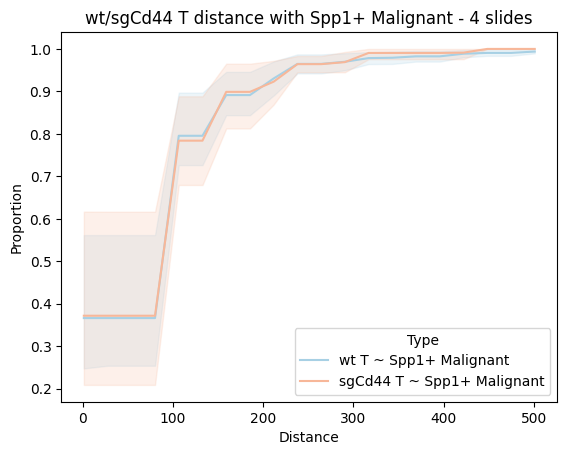

In [612]:
sns.lineplot(pdf[np.isin(pdf.variable, ['wt T ~ Spp1+ Malignant', 'sgCd44 T ~ Spp1+ Malignant'])], x='index', y='value', hue='variable', palette='RdBu_r')
plt.legend(title='Type', loc='lower right')
plt.xlabel('Distance')
plt.ylabel('Proportion')
plt.title('wt/sgCd44 T distance with Spp1+ Malignant - 4 slides')

Text(0.5, 1.0, 'wt/sgCd44 T distance with Spp1+ Macrophage - 4 slides')

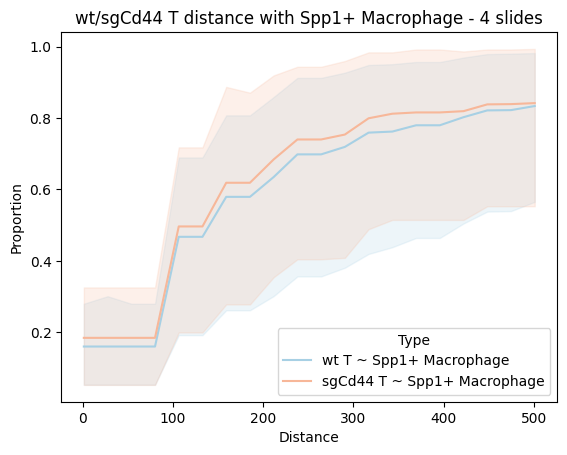

In [614]:
sns.lineplot(pdf[np.isin(pdf.variable, ['wt T ~ Spp1+ Macrophage', 'sgCd44 T ~ Spp1+ Macrophage'])], x='index', y='value', hue='variable', palette='RdBu_r')
plt.legend(title='Type', loc='lower right')
plt.xlabel('Distance')
plt.ylabel('Proportion')
plt.title('wt/sgCd44 T distance with Spp1+ Macrophage - 4 slides')

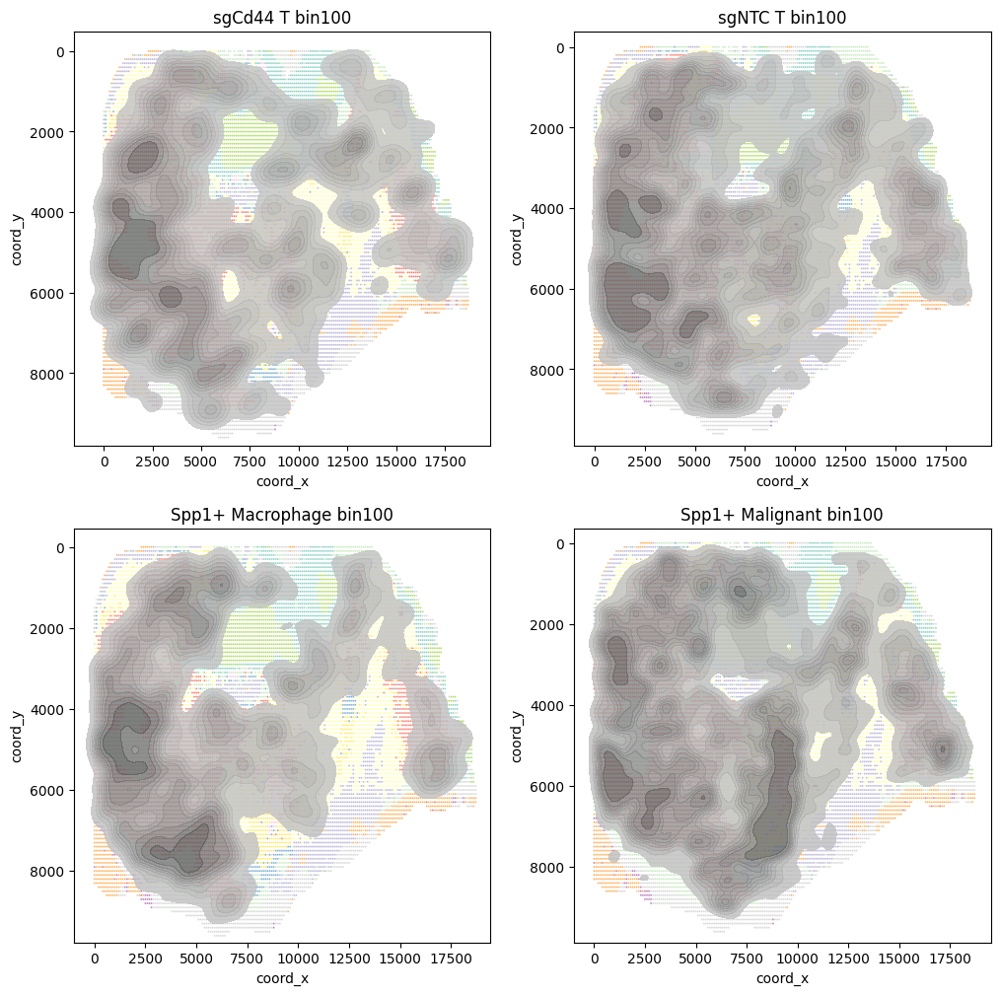

In [617]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
masks = [mask_sgcd44_t, mask_sgntc_t, mask_spp1_macrophage, mask_spp1_malignant]
mask_names = ['sgCd44 T', 'sgNTC T', 'Spp1+ Macrophage', 'Spp1+ Malignant']
for idx, mask in enumerate(masks):
    ax = axs[idx // 2, idx % 2]
    ax.set_title(f'{mask_names[idx]} bin100')
    plot_data = pdata[mask].copy()
    sns.scatterplot(gdata[gdata.obs.marker == '2-2'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', ax=ax, legend=False)
    sns.kdeplot(x=plot_data.obsm['spatial'][:, 0], y=plot_data.obsm['spatial'][:, 1], hue=[0] * len(plot_data.obsm['spatial']), palette='Greys', fill=True, bw_adjust=0.3, alpha=0.8, legend=False, ax=ax)
    ax.invert_yaxis()

31 710
6118
2239


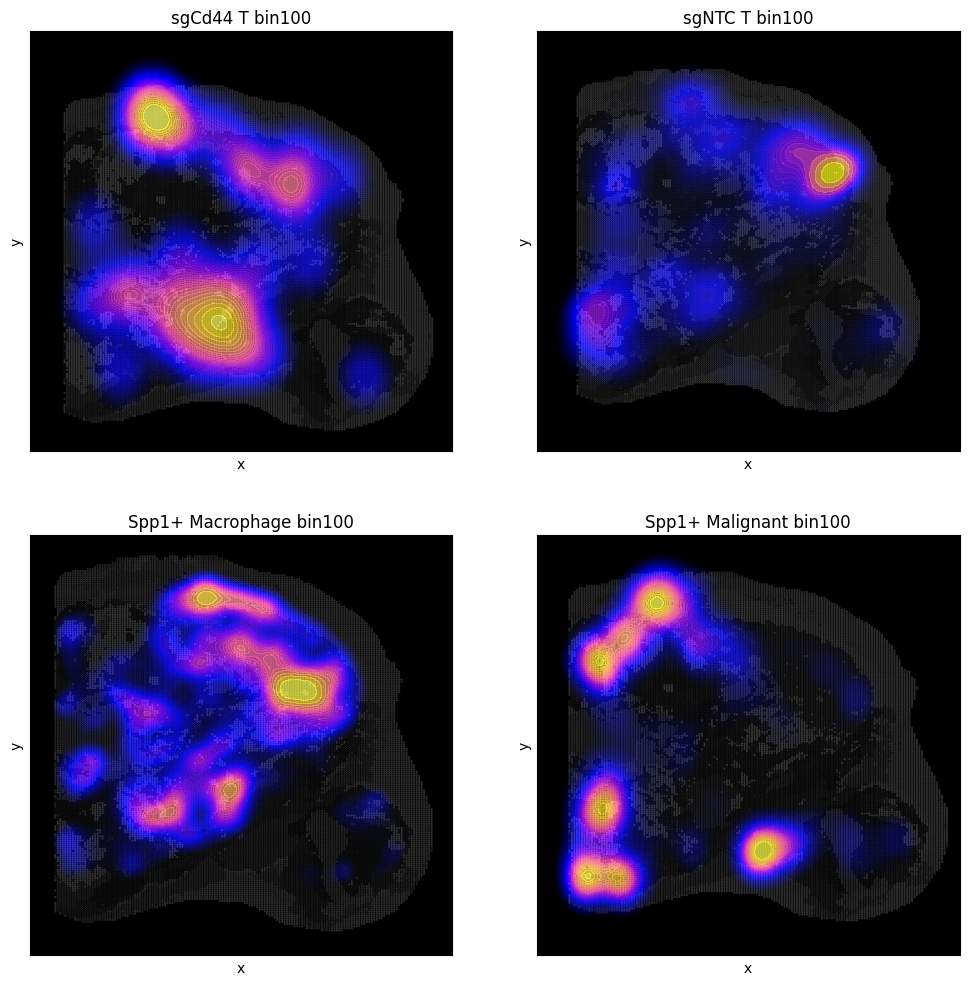

In [28]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

MARKER = '2-1'

pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

masks = [mask_sgcd44_t, mask_sgntc_t, mask_spp1_macrophage, mask_spp1_malignant]
mask_names = ['sgCd44 T', 'sgNTC T', 'Spp1+ Macrophage', 'Spp1+ Malignant']
for idx, mask in enumerate(masks):
    ax = axs[idx // 2, idx % 2]
    ax.set_title(f'{mask_names[idx]} bin100')
    ax.set_facecolor('black')
    plot_data = pdata[mask].copy()

    plot_matrix = pdata[mask].obsm['spatial']
    dist_matrix = distance_matrix(plot_matrix, plot_matrix)
    w = (dist_matrix < 210).sum(axis=0)

    sns.kdeplot(x=plot_data.obsm['spatial'][:, 0], y=plot_data.obsm['spatial'][:, 1], weights=w, cmap='gnuplot2', fill=True, bw_adjust=0.5, alpha=0.8, legend=False, levels=40, ax=ax)
    sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='binary_r', ax=ax, legend=False, alpha=0.2)

    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_ylabel('y')
    ax.set_xlabel('x')
    ax.invert_yaxis()
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/sgCd44_Macrophage.pdf", format="pdf", bbox_inches='tight')

22 1469
137
1161


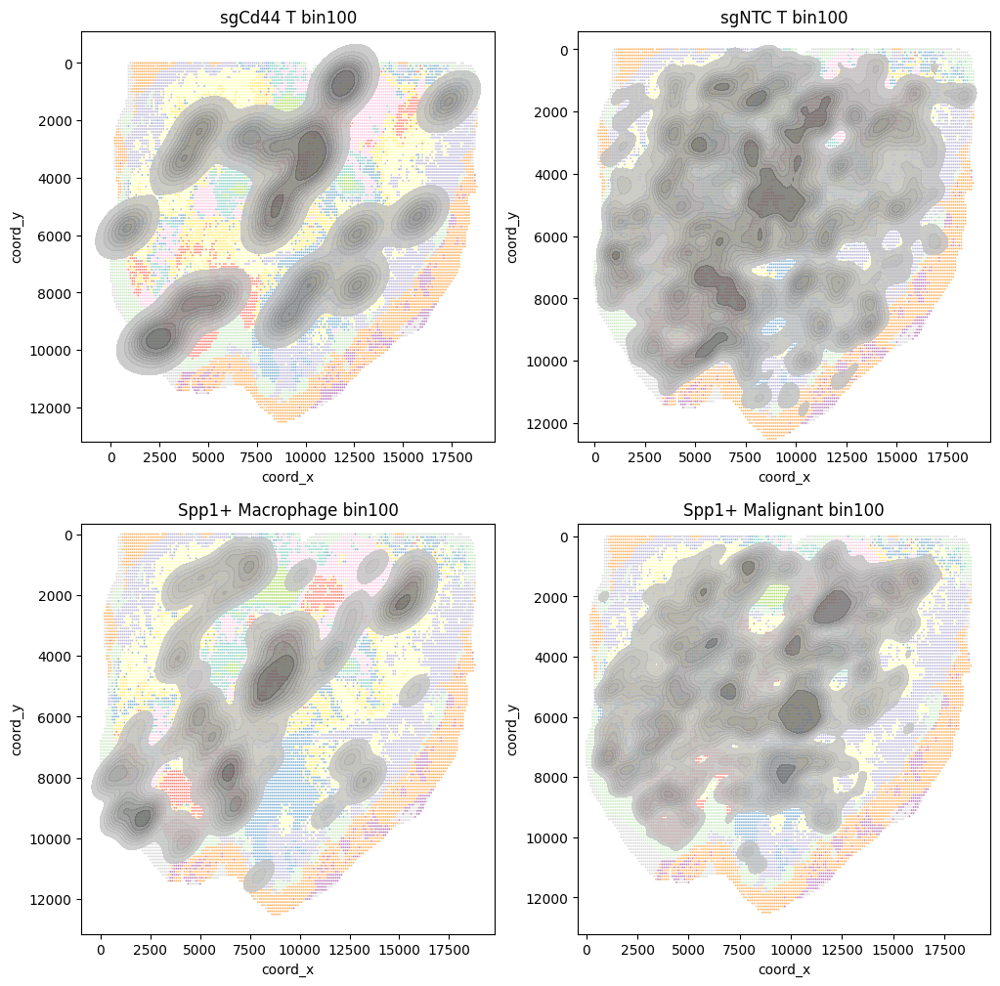

In [622]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

MARKER = '1-2'

pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

masks = [mask_sgcd44_t, mask_sgntc_t, mask_spp1_macrophage, mask_spp1_malignant]
mask_names = ['sgCd44 T', 'sgNTC T', 'Spp1+ Macrophage', 'Spp1+ Malignant']
for idx, mask in enumerate(masks):
    ax = axs[idx // 2, idx % 2]
    ax.set_title(f'{mask_names[idx]} bin100')
    plot_data = pdata[mask].copy()
    sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', ax=ax, legend=False)
    sns.kdeplot(x=plot_data.obsm['spatial'][:, 0], y=plot_data.obsm['spatial'][:, 1], hue=[0] * len(plot_data.obsm['spatial']), palette='Greys', fill=True, bw_adjust=0.3, alpha=0.8, legend=False, ax=ax)
    ax.invert_yaxis()

62 724
3825
8249


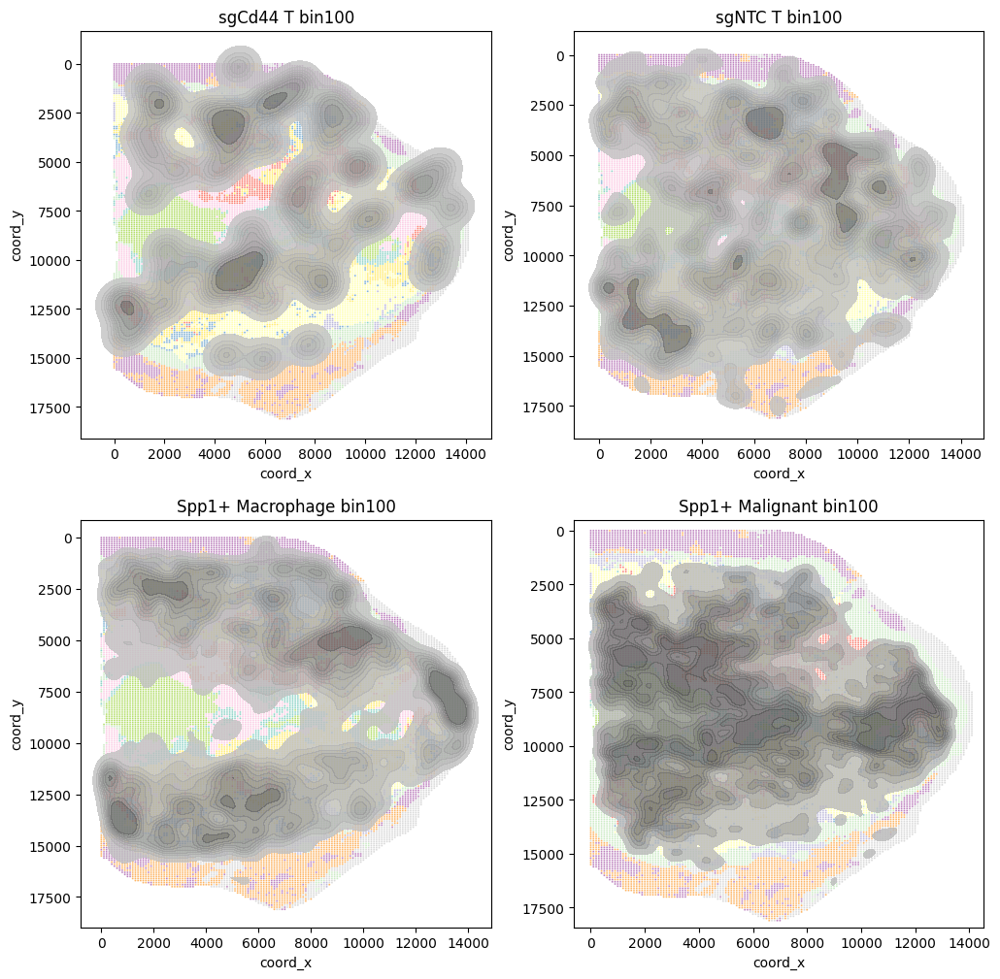

In [621]:
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

MARKER = '1-1'

pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

masks = [mask_sgcd44_t, mask_sgntc_t, mask_spp1_macrophage, mask_spp1_malignant]
mask_names = ['sgCd44 T', 'sgNTC T', 'Spp1+ Macrophage', 'Spp1+ Malignant']
for idx, mask in enumerate(masks):
    ax = axs[idx // 2, idx % 2]
    ax.set_title(f'{mask_names[idx]} bin100')
    plot_data = pdata[mask].copy()
    sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', ax=ax, legend=False)
    sns.kdeplot(x=plot_data.obsm['spatial'][:, 0], y=plot_data.obsm['spatial'][:, 1], hue=[0] * len(plot_data.obsm['spatial']), palette='Greys', fill=True, bw_adjust=0.3, alpha=0.8, legend=False, ax=ax)
    ax.invert_yaxis()

# Global Distance

In [10]:
MARKER = '2-2'

In [11]:
pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 1)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 1).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

489 733
1233
1081


In [19]:
from scipy.spatial import distance_matrix

In [26]:
dist_matrix = distance_matrix(pdata[mask_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])

<Axes: ylabel='Count'>

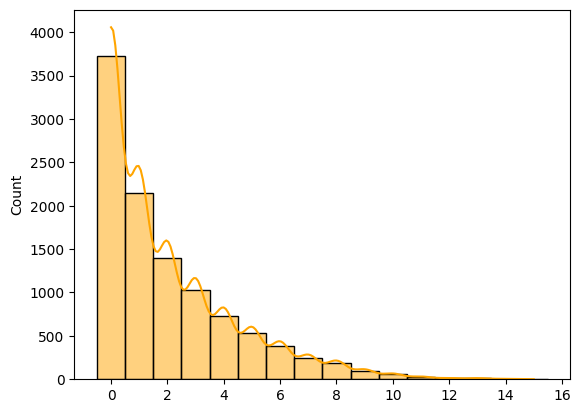

In [47]:
dist = (dist_matrix < 250).sum(axis=1)
sns.histplot(dist, kde=True, discrete=True, color='orange')

In [92]:
def zscore(value):
    return (value - 0) ** 2

In [66]:
guide_matrix = distance_matrix(pdata[mask_sgcd44_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])
ntc_matrix = distance_matrix(pdata[mask_sgntc_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])

guide_dist = (guide_matrix < 250).sum(axis=1)
ntc_dist = (ntc_matrix < 250).sum(axis=1)

<Axes: xlabel='coord_x', ylabel='coord_y'>

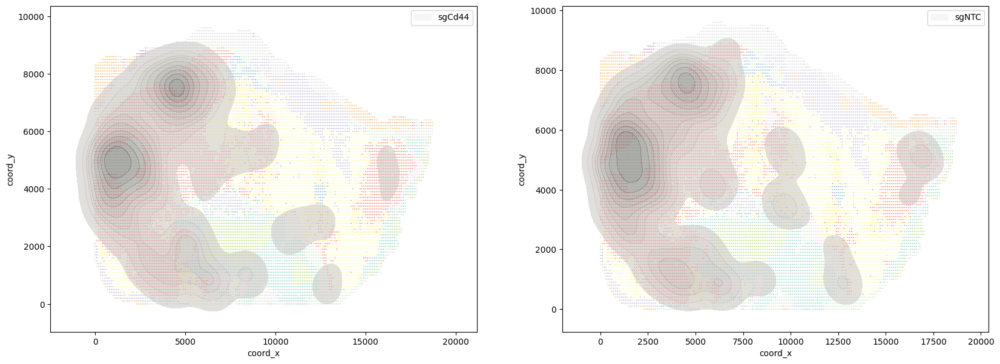

In [88]:
z_guide = [zscore(dist, d) for d in guide_dist]
z_ntc = [zscore(dist, d) for d in ntc_dist]

fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sns.scatterplot(gdata[gdata.obs.marker == '2-2'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[0])
sns.scatterplot(gdata[gdata.obs.marker == '2-2'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[1])
sns.kdeplot(x=pdata[mask_sgcd44_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgcd44_t].obsm['spatial'][:, 1].tolist(),
    weights=z_guide, bw_adjust=0.5, hue=['sgCd44'] * np.sum(mask_sgcd44_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[0])
sns.kdeplot(x=pdata[mask_sgntc_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgntc_t].obsm['spatial'][:, 1].tolist(),
    weights=z_ntc, bw_adjust=0.5, hue=['sgNTC'] * np.sum(mask_sgntc_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[1])

49 85
6118
2239


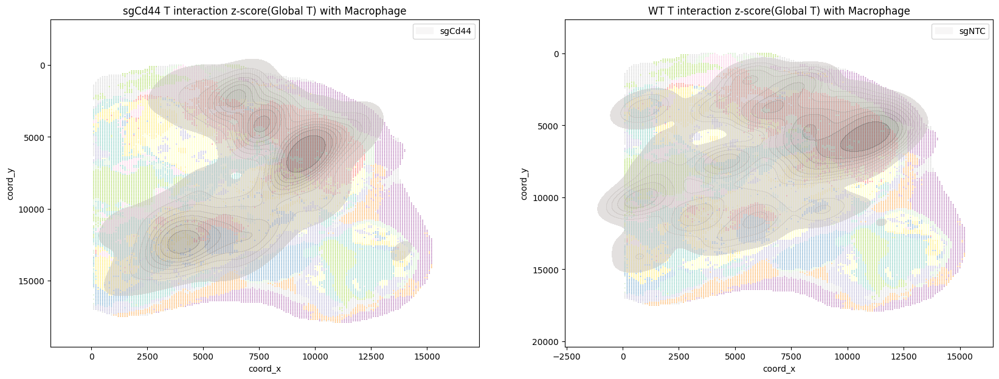

In [104]:
MARKER = '2-1'

pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 1)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 1).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

dist_matrix = distance_matrix(pdata[mask_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])

guide_matrix = distance_matrix(pdata[mask_sgcd44_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])
ntc_matrix = distance_matrix(pdata[mask_sgntc_t].obsm['spatial'], pdata[mask_spp1_macrophage].obsm['spatial'])

guide_dist = (guide_matrix < 250).sum(axis=1)
ntc_dist = (ntc_matrix < 250).sum(axis=1)

z_guide = [zscore(d) for d in guide_dist]
z_ntc = [zscore(d) for d in ntc_dist]

fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[0])
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[1])
sns.kdeplot(x=pdata[mask_sgcd44_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgcd44_t].obsm['spatial'][:, 1].tolist(),
    weights=z_guide, bw_adjust=0.5, hue=['sgCd44'] * np.sum(mask_sgcd44_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[0])
sns.kdeplot(x=pdata[mask_sgntc_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgntc_t].obsm['spatial'][:, 1].tolist(),
    weights=z_ntc, bw_adjust=0.5, hue=['sgNTC'] * np.sum(mask_sgntc_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[1])
ax[0].invert_yaxis()
ax[1].invert_yaxis()
ax[0].set_title('sgCd44 T interaction z-score(Global T) with Macrophage')
ax[1].set_title('WT T interaction z-score(Global T) with Macrophage')
plt.show()

49 85
6118
2239


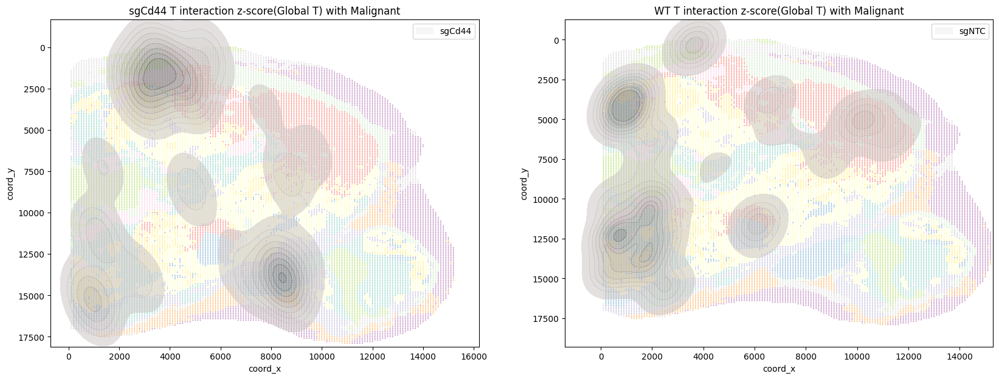

In [103]:
MARKER = '2-1'

pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 1)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 1).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

dist_matrix = distance_matrix(pdata[mask_t].obsm['spatial'], pdata[mask_spp1_malignant].obsm['spatial'])

guide_matrix = distance_matrix(pdata[mask_sgcd44_t].obsm['spatial'], pdata[mask_spp1_malignant].obsm['spatial'])
ntc_matrix = distance_matrix(pdata[mask_sgntc_t].obsm['spatial'], pdata[mask_spp1_malignant].obsm['spatial'])

guide_dist = (guide_matrix < 250).sum(axis=1)
ntc_dist = (ntc_matrix < 250).sum(axis=1)

z_guide = [zscore(d) for d in guide_dist]
z_ntc = [zscore(d) for d in ntc_dist]

fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[0])
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[1])
sns.kdeplot(x=pdata[mask_sgcd44_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgcd44_t].obsm['spatial'][:, 1].tolist(),
    weights=z_guide, bw_adjust=0.3, hue=['sgCd44'] * np.sum(mask_sgcd44_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[0])
sns.kdeplot(x=pdata[mask_sgntc_t].obsm['spatial'][:, 0].tolist(), y=pdata[mask_sgntc_t].obsm['spatial'][:, 1].tolist(),
    weights=z_ntc, bw_adjust=0.3, hue=['sgNTC'] * np.sum(mask_sgntc_t), palette='RdBu_r', fill=True, alpha=0.5, ax=ax[1])
ax[0].invert_yaxis()
ax[1].invert_yaxis()
ax[0].set_title('sgCd44 T interaction z-score(Global T) with Malignant')
ax[1].set_title('WT T interaction z-score(Global T) with Malignant')
plt.show()

# T subtypes

In [142]:
T_marker = {
    "memory T": ["Il7r", "Cd27", 'Ccr4','Eomes','Gpr183'],
    "effector T": ['Cd8a','Cd8b1', 'Cd69','Ifng', 'Gzme', 'Gzmf', 'Gzmn', 'Gzmd', 'Gzmg', "Gzmk", "Gzma", "Gzmb", "Prf1", "Nkg7"],
    "exhausted T": ["Lag3", "Pdcd1", "Tigit", "Ctla4", 'Tox', 'Sirpb1b', 'Sirpb1a', 'Sirpa','Tnfrsf9','Tnfrsf18',  'Cxcr6', 'Cxcl13'],
    "stem-like T": ["Tcf7", "Foxo1"]
}
for marker in T_marker:
    sc.tl.score_genes(fdata, T_marker[marker], score_name=f'{marker}_score')
    # fdata.obs[f'{marker}_score'] = fdata[:, T_marker[marker]].X.sum(axis=1)

In [143]:
mask = (gdata.obs.marker == '2-1') & (gdata.obs.cluster == 3)
guide_vec = gdata[mask].copy()
expr_vec = fdata[mask].copy()

print(spearmanr(guide_vec[:, 'sgCd44'].X.flatten(), expr_vec.obs['exhausted T_score']))
print(spearmanr(guide_vec[:, 'sgCd44'].X.flatten(), expr_vec.obs['effector T_score']))
print(spearmanr(guide_vec[:, 'sgCd44'].X.flatten(), expr_vec.obs['memory T_score']))
print(spearmanr(guide_vec[:, 'sgCd44'].X.flatten(), expr_vec.obs['stem-like T_score']))

SignificanceResult(statistic=-0.01589501845519481, pvalue=0.4009864607253154)
SignificanceResult(statistic=-0.015342412273944483, pvalue=0.4175617176009867)
SignificanceResult(statistic=-0.010654368626414244, pvalue=0.5734786053237604)
SignificanceResult(statistic=-0.008480379514628005, pvalue=0.6541056197832739)


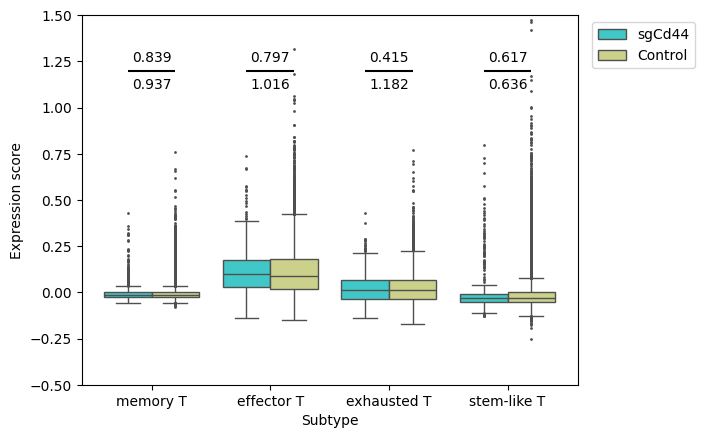

In [145]:
cdf = pd.DataFrame()
p_value = {}
l2fc_value = {}
MARKER = ['1-2', '1-1', '2-1', '2-2']
df = (annotation[annotation.obs.annotations.str.endswith('T')].obs.groupby(['marker', 'coord_x', 'coord_y']).count().unstack().unstack() > 2)['annotations'].melt(ignore_index=False).reset_index()
mask_t = np.array(gdata.obs.join(df.set_index(['marker', 'coord_x', 'coord_y']), on=['marker', 'coord_x', 'coord_y']).value.tolist(), dtype=bool)
for marker in T_marker:
    score_name = marker + "_score"
    mask = (np.isin(gdata.obs.marker, MARKER)) & (gdata[:, 'sgCd44'].X > 0).flatten() & mask_t
    guide_vec = fdata[mask].obs[score_name]
    mask = (np.isin(gdata.obs.marker, MARKER)) & (gdata[:, 'sgnon-targeting'].X > 0).flatten() & mask_t
    ntc_vec = fdata[mask].obs[score_name]

    cdf = pd.concat([cdf, pd.DataFrame({
        'Subtype': [score_name.rstrip('_score')] * (len(guide_vec) + len(ntc_vec)),
        'Perturbation': ['sgCd44'] * len(guide_vec) + ['Control'] * len(ntc_vec),
        'Expression score': guide_vec.tolist() + ntc_vec.tolist()
    })])
    p_value[marker] = f_oneway(guide_vec, ntc_vec)[1]
    l2fc_value[marker] = np.mean(guide_vec) / np.mean(ntc_vec)

sns.boxplot(cdf, x='Subtype', y='Expression score', hue='Perturbation', palette='rainbow', fliersize=1)
for idx, marker in enumerate(p_value):
    plt.hlines(1.2, idx-0.2, idx+0.2, color='black')
    plt.text(idx, 1.25, int(p_value[marker] * 1000) / 1000, ha='center')
    plt.text(idx, 1.10, int(l2fc_value[marker] * 1000) / 1000, ha='center')
    # plt.text(idx, 1.25, '**' if p_value[marker] < 0.05 else 'n.s.', ha='center')
plt.ylim([-0.5, 1.5])
plt.legend(bbox_to_anchor=(1.25, 1))
plt.show()

# Correlation

In [160]:
from scipy.stats import entropy
MARKER = '2-1'
pdata = gdata[gdata.obs.marker == MARKER].copy()
pdata.obs['shannon_index'] = np.apply_along_axis(entropy, 1, pdata.X)
pdata.obs['shannon_index'].fillna(0, inplace=True)

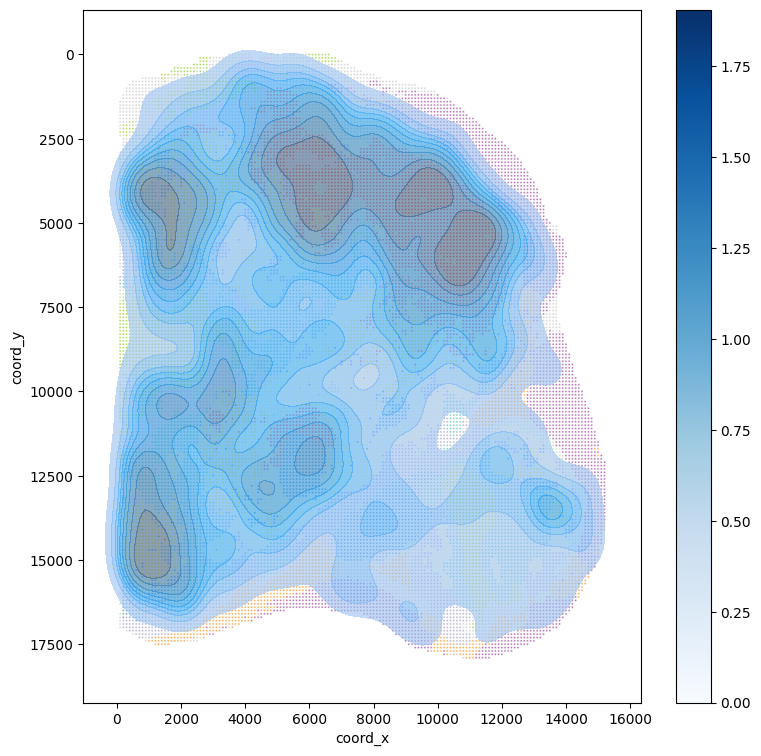

In [175]:
plt.figure(figsize=(9, 9))
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False)
scatter = sns.kdeplot(pdata.obs, x='coord_x', y='coord_y', weights='shannon_index',
    cmap='Blues', bw_adjust=0.5, fill=True, hue='marker', legend=False, alpha=0.6)
plt.gca().invert_yaxis()

norm = plt.Normalize(vmin=pdata.obs['shannon_index'].min(), vmax=pdata.obs['shannon_index'].max())
sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=scatter.axes)

plt.show()

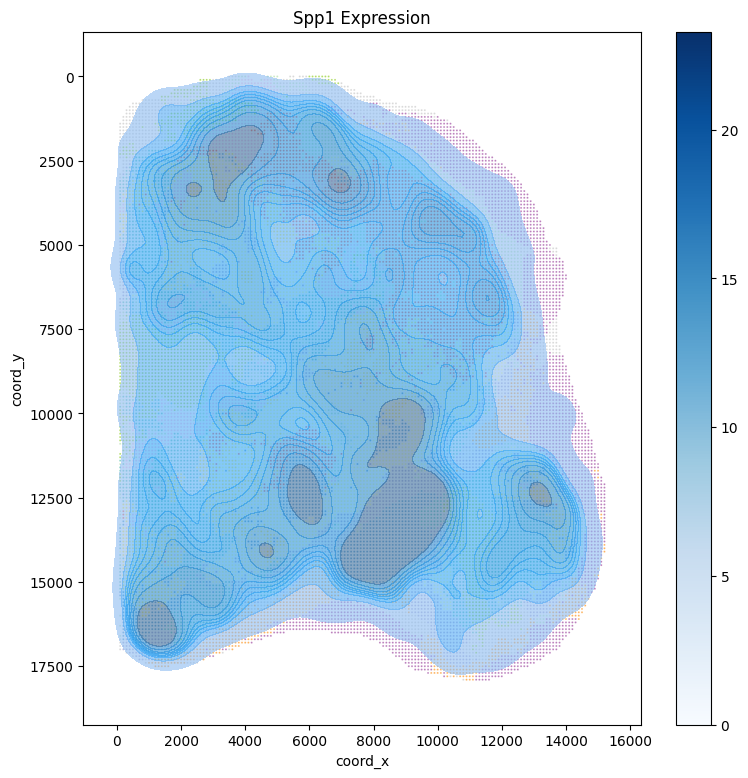

In [177]:
plt.figure(figsize=(9, 9))
pdata.obs['gene_expression'] = fdata[fdata.obs.marker == MARKER, 'Spp1'].X.toarray() 
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False)
scatter = sns.kdeplot(pdata.obs, x='coord_x', y='coord_y', weights='gene_expression',
    cmap='Blues', bw_adjust=0.5, fill=True, hue='marker', legend=False, alpha=0.6)
plt.gca().invert_yaxis()

norm = plt.Normalize(vmin=pdata.obs['gene_expression'].min(), vmax=pdata.obs['gene_expression'].max())
sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=scatter.axes)
plt.title('Spp1 Expression')

plt.show()

In [72]:
sc.tl.rank_genes_groups?

Signature:
sc.tl.rank_genes_groups(
    adata: anndata._core.anndata.AnnData,
    groupby: str,
    use_raw: Optional[bool] = None,
    groups: Union[Literal['all'], Iterable[str]] = 'all',
    reference: str = 'rest',
    n_genes: Optional[int] = None,
    rankby_abs: bool = False,
    pts: bool = False,
    key_added: Optional[str] = None,
    copy: bool = False,
    method: Optional[Literal['logreg', 't-test', 'wilcoxon', 't-test_overestim_var']] = None,
    corr_method: Literal['benjamini-hochberg', 'bonferroni'] = 'benjamini-hochberg',
    tie_correct: bool = False,
    layer: Optional[str] = None,
    **kwds,
) -> Optional[anndata._core.anndata.AnnData]
Docstring:
Rank genes for characterizing groups.

Expects logarithmized data.

Parameters
----------
adata : AnnData
    Annotated data matrix.
groupby : str
    The key of the observations grouping to consider.
use_raw : Optional, optional (default: None)
    Use `raw` attribute of `adata` if present.
layer : Optional, optional (

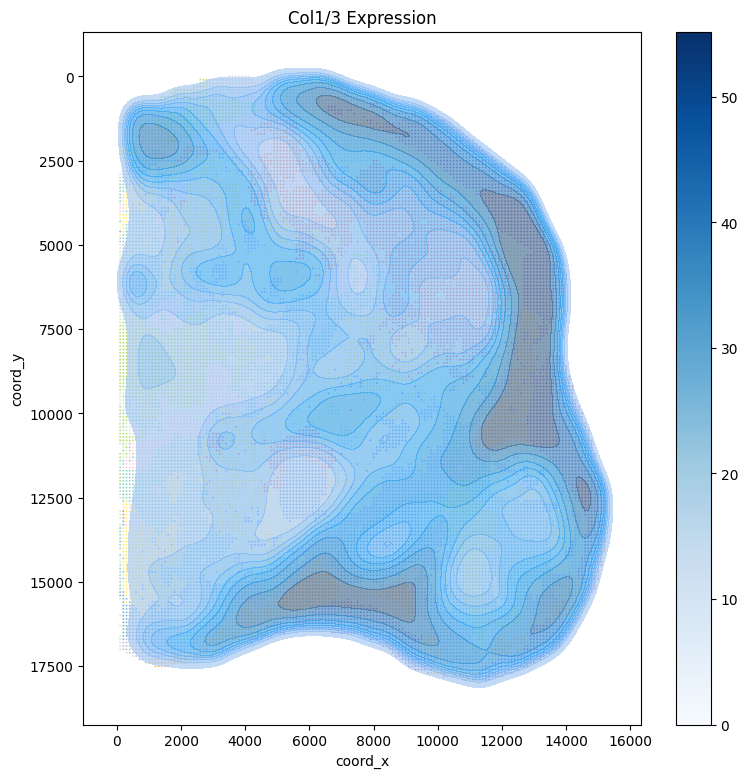

In [185]:
plt.figure(figsize=(9, 9))
pdata.obs['gene_expression'] = fdata[fdata.obs.marker == MARKER, ['Col1a1', 'Col3a1', 'Col1a2']].X.toarray().sum(axis=1)
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False)
scatter = sns.kdeplot(pdata.obs, x='coord_x', y='coord_y', weights='gene_expression',
    cmap='Blues', bw_adjust=0.5, fill=True, hue='marker', legend=False, alpha=0.6)
plt.gca().invert_yaxis()

norm = plt.Normalize(vmin=pdata.obs['gene_expression'].min(), vmax=pdata.obs['gene_expression'].max())
sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=scatter.axes)
plt.title('Col1/3 Expression')

plt.show()

In [150]:
from scipy.stats import ttest_rel
sgCd44_bins = (gdata[:, 'sgCd44'].X > 0).flatten()
sgNTC_bins = (gdata[:, 'sgnon-targeting'].X > 0).flatten()

sum(sgCd44_bins | sgNTC_bins)

13729

# Spatial Specific Distance

In [186]:
MARKER = '2-1'

In [246]:
pdata = gdata[gdata.obs.marker == MARKER].copy()
df = (annotation[(annotation.obs.marker == MARKER) & annotation.obs.annotations.str.endswith('T')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 1)['annotations'].melt(ignore_index=False).reset_index()
mask_t = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()

mask_sgcd44_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgCd44'].X.flatten() > 0).flatten() & np.array(mask_t, dtype=bool)
mask_sgntc_t = np.array(gdata[gdata.obs.marker == MARKER][:, 'sgnon-targeting'].X.flatten() > 1).flatten() & np.array(mask_t, dtype=bool)
print(sum(mask_sgcd44_t), sum(mask_sgntc_t))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Macrophages')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 12)['annotations'].melt(ignore_index=False).reset_index()
mask_macrophage = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_macrophage = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_macrophage, dtype=bool)
print(sum(mask_spp1_macrophage))

df = (annotation[(annotation.obs.marker == MARKER) & (annotation.obs.annotations == 'Malignant')].obs.groupby(['coord_x', 'coord_y']).count().unstack() > 7)['annotations'].melt(ignore_index=False).reset_index()
mask_malignant = gdata[gdata.obs.marker == MARKER].obs.join(df.set_index(['coord_x', 'coord_y']), on=['coord_x', 'coord_y']).value.tolist()
mask_spp1_malignant = (fdata[fdata.obs.marker == MARKER][:, 'Spp1'].X > 0).toarray().flatten() & np.array(mask_malignant, dtype=bool)
print(sum(mask_spp1_malignant))

49 85
6118
2239


In [217]:
sgcd44_coords = pdata[mask_sgcd44_t].obsm['spatial']
ntc_coords = pdata[mask_sgntc_t].obsm['spatial']

macro_coords = pdata[mask_spp1_macrophage].obsm['spatial']
mag_coords = pdata[mask_spp1_malignant].obsm['spatial']

In [197]:
from sklearn.metrics import pairwise_distances

In [229]:
df = pd.DataFrame({
    'coord_x': sgcd44_coords[:, 0].tolist() + ntc_coords[:, 0].tolist(),
    'coord_y': sgcd44_coords[:, 1].tolist() + ntc_coords[:, 1].tolist(),
    'Distance': pairwise_distances(sgcd44_coords, macro_coords).min(axis=1).tolist() +\
        pairwise_distances(ntc_coords, macro_coords).min(axis=1).tolist(),
    'Guide': ['sgCd44'] * sgcd44_coords.shape[0] + ['sgNTC'] * ntc_coords.shape[0],
    'Cell': ['Macrophage'] * (sgcd44_coords.shape[0] + ntc_coords.shape[0])
})

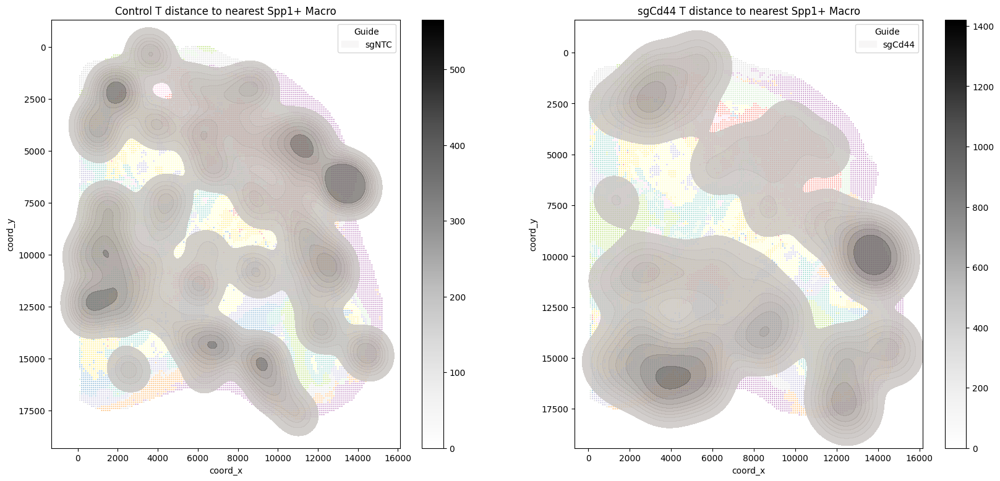

In [243]:
fig, ax = plt.subplots(1, 2, figsize=(20, 9))
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[0])
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[1])
sns.kdeplot(df[df.Guide == 'sgNTC'], x='coord_x', y='coord_y', hue='Guide', weights='Distance', palette='RdBu_r', bw_adjust=0.3, fill=True, alpha=0.8, ax=ax[0])
sns.kdeplot(df[df.Guide == 'sgCd44'], x='coord_x', y='coord_y', hue='Guide', weights='Distance', palette='RdBu_r', bw_adjust=0.3, fill=True, alpha=0.8, ax=ax[1])
ax[0].invert_yaxis()
ax[1].invert_yaxis()


norm = plt.Normalize(vmin=df[df.Guide == 'sgNTC'].Distance.min(), vmax=df[df.Guide == 'sgNTC'].Distance.max())
sm = plt.cm.ScalarMappable(cmap="Greys", norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax[0])
norm = plt.Normalize(vmin=df[df.Guide == 'sgCd44'].Distance.min(), vmax=df[df.Guide == 'sgCd44'].Distance.max())
sm = plt.cm.ScalarMappable(cmap="Greys", norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax[1])
ax[0].set_title('Control T distance to nearest Spp1+ Macro')
ax[1].set_title('sgCd44 T distance to nearest Spp1+ Macro')
plt.show()

In [244]:
df = pd.DataFrame({
    'coord_x': sgcd44_coords[:, 0].tolist() + ntc_coords[:, 0].tolist(),
    'coord_y': sgcd44_coords[:, 1].tolist() + ntc_coords[:, 1].tolist(),
    'Distance': pairwise_distances(sgcd44_coords, mag_coords).min(axis=1).tolist() +\
        pairwise_distances(ntc_coords, mag_coords).min(axis=1).tolist(),
    'Guide': ['sgCd44'] * sgcd44_coords.shape[0] + ['sgNTC'] * ntc_coords.shape[0],
    'Cell': ['Malignant'] * (sgcd44_coords.shape[0] + ntc_coords.shape[0])
})

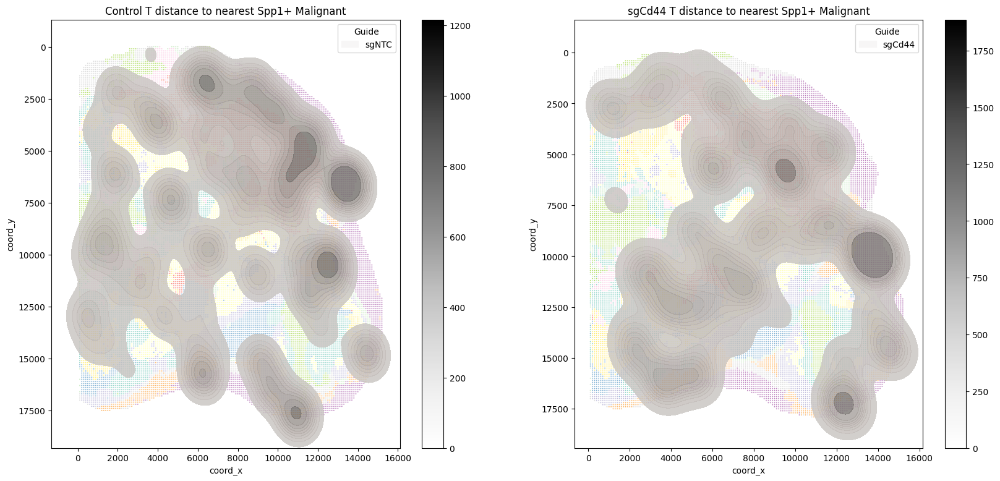

In [245]:
fig, ax = plt.subplots(1, 2, figsize=(20, 9))
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[0])
sns.scatterplot(gdata[gdata.obs.marker == MARKER].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=False, ax=ax[1])
sns.kdeplot(df[df.Guide == 'sgNTC'], x='coord_x', y='coord_y', hue='Guide', weights='Distance', palette='RdBu_r', bw_adjust=0.3, fill=True, alpha=0.8, ax=ax[0])
sns.kdeplot(df[df.Guide == 'sgCd44'], x='coord_x', y='coord_y', hue='Guide', weights='Distance', palette='RdBu_r', bw_adjust=0.3, fill=True, alpha=0.8, ax=ax[1])
ax[0].invert_yaxis()
ax[1].invert_yaxis()


norm = plt.Normalize(vmin=df[df.Guide == 'sgNTC'].Distance.min(), vmax=df[df.Guide == 'sgNTC'].Distance.max())
sm = plt.cm.ScalarMappable(cmap="Greys", norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax[0])
norm = plt.Normalize(vmin=df[df.Guide == 'sgCd44'].Distance.min(), vmax=df[df.Guide == 'sgCd44'].Distance.max())
sm = plt.cm.ScalarMappable(cmap="Greys", norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax[1])
ax[0].set_title('Control T distance to nearest Spp1+ Malignant')
ax[1].set_title('sgCd44 T distance to nearest Spp1+ Malignant')
plt.show()

# Define Border

In [57]:
pdata = annotation[annotation.obs.marker == '2-1'].copy()
pdata = pdata[pdata.obs.annotations == 'Malignant'].copy()

<Axes: >

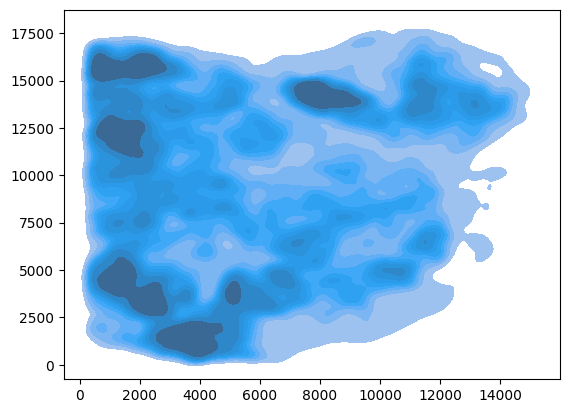

In [252]:
sns.kdeplot(x=pdata.obsm['spatial'][:, 0], y=pdata.obsm['spatial'][:, 1], bw_adjust=0.4, fill=True)

In [58]:
sc.tl.score_genes(pdata, gene_list=['Col1a1', 'Col1a2', 'Col3a1'], score_name='Stiff_score')

In [59]:
pdata.obs['Stiff_score'] = [score if score > 0 else 0 for score in pdata.obs['Stiff_score']]

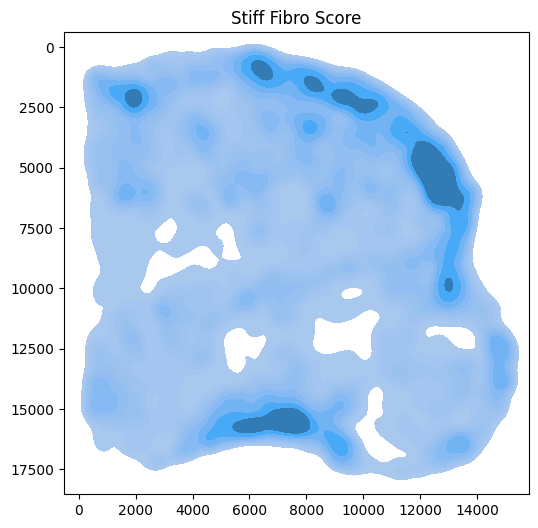

In [259]:
plt.figure(figsize=(6, 6))
pdata = annotation[annotation.obs.marker == '2-1'].copy()
sc.tl.score_genes(pdata, gene_list=['Col1a1', 'Col1a2', 'Col3a1'], score_name='Stiff_score')
pdata.obs['Stiff_score'] = [score if score > 0 else 0 for score in pdata.obs['Stiff_score']]
sns.kdeplot(x=pdata.obsm['spatial'][:, 0], y=pdata.obsm['spatial'][:, 1], weights=pdata.obs['Stiff_score'], bw_adjust=0.4, fill=True)
plt.gca().invert_yaxis()
plt.title('Stiff Fibro Score')
plt.show()

In [61]:
from scipy.stats import gaussian_kde

kde_data = pdata[pdata.obs.Stiff_score > 0].copy()
kde_a = gaussian_kde(np.vstack([kde_data.obsm['spatial'][:, 0], kde_data.obsm['spatial'][:, 1], kde_data.obs['Stiff_score']]))

In [266]:
xmin, ymin = kde_data.obsm['spatial'].min(axis=0)
xmax, ymax = kde_data.obsm['spatial'].max(axis=0)
x, y = np.linspace(xmin, xmax, 100), np.linspace(ymin, ymax, 100)
z = np.linspace(0, np.max(kde_data.obs['Stiff_score']), num=20)
X, Y, Z = np.meshgrid(x, y, z)
grid_coords = np.vstack([X.ravel(), Y.ravel(), Z.ravel()])

Za = kde_a(grid_coords)

In [276]:
Z = np.reshape(Za.T, X.shape)

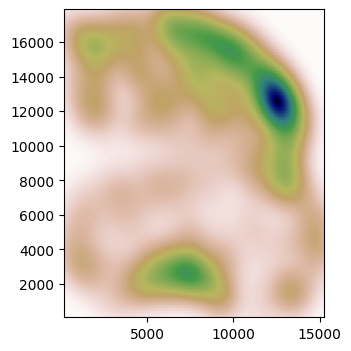

In [317]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.imshow((Z[:, :, 2]), cmap=plt.cm.gist_earth_r, extent=[xmin, xmax, ymin, ymax])
# ax.plot(m1, m2, 'k.', markersize=2)
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
plt.show()

In [62]:
spatial_coords = kde_data.obsm['spatial']
gene_expression = kde_data.obs['Stiff_score']
data_kde = np.vstack([spatial_coords[:, 0], spatial_coords[:, 1], gene_expression]).T
from statsmodels.nonparametric.kernel_density import KDEMultivariate
kde = KDEMultivariate(data_kde, var_type='ccu')
Zb = kde.pdf(data_kde)

In [70]:
Z = np.reshape(Zb.T, ())
Z.shape

ValueError: cannot reshape array of size 21088 into shape (8,)

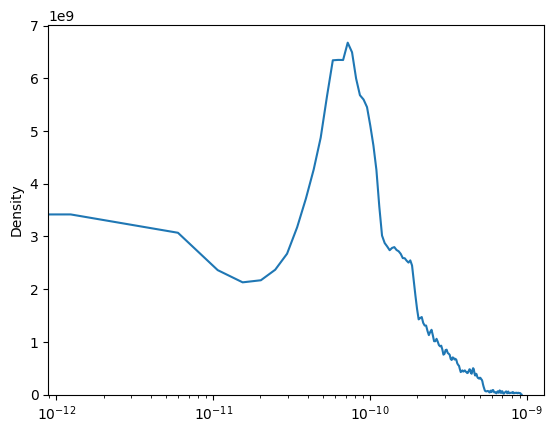

In [350]:
sns.kdeplot(Z[:, :, 2].flatten(), bw_adjust=0.2)
plt.gca().set_xscale('log')
# plt.xlim([1e-20, 1e-9])

In [409]:
Z[:, :, 2:].sum(axis=2).max()

1.8046142481597766e-09

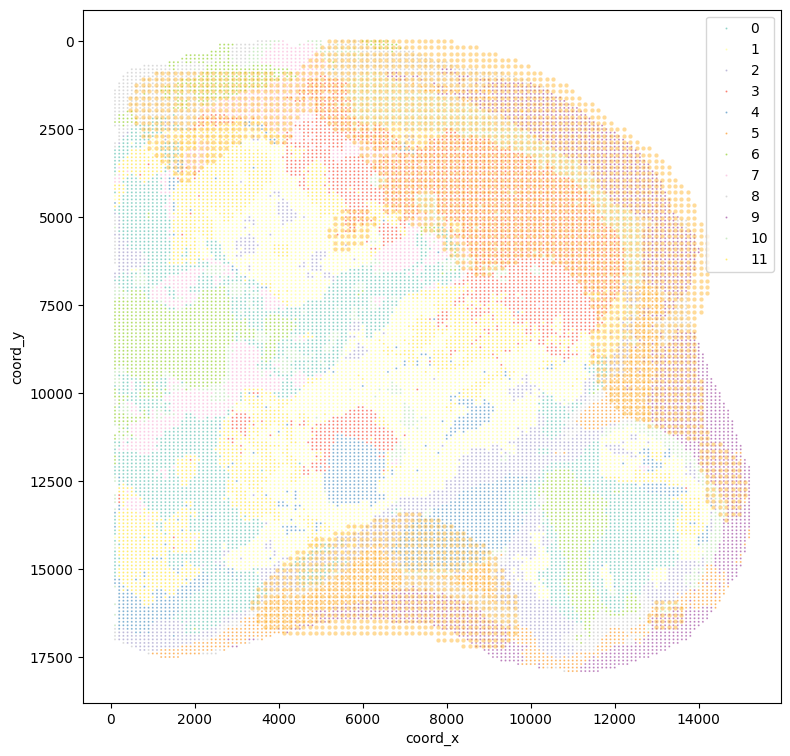

In [437]:
x = []
y = []
for i, tag in enumerate((Z[:, :, 2:].sum(axis=2) > 25e-11).flatten()):
    if tag:
        y.append(i // 100 * ymax / 100)
        x.append(i % 100 * xmax / 100)
plt.figure(figsize=(9, 9))
sns.scatterplot(gdata[gdata.obs.marker == '2-1'].obs, x='coord_x', y='coord_y', hue='cluster', s=2, palette='Set3', legend=True)
sns.scatterplot(x=x, y=y, s=10, color='orange', alpha=0.4)
plt.gca().invert_yaxis()

In [ ]:
# Number of cells
pdf = pd.DataFrame({
    'Guide': gdata.var_names,
    'Proportion': 
})

# HA

In [50]:
pdata = fdata[fdata.obs.marker == '2-1'].copy()
ha_genes = ['Has1', 'Has2', 'Has3', 'Abcc5', 'Cemip']
sc.tl.score_genes(pdata, ha_genes, score_name='Hyaluronan_score')

IndexError: cannot do a non-empty take from an empty axes.

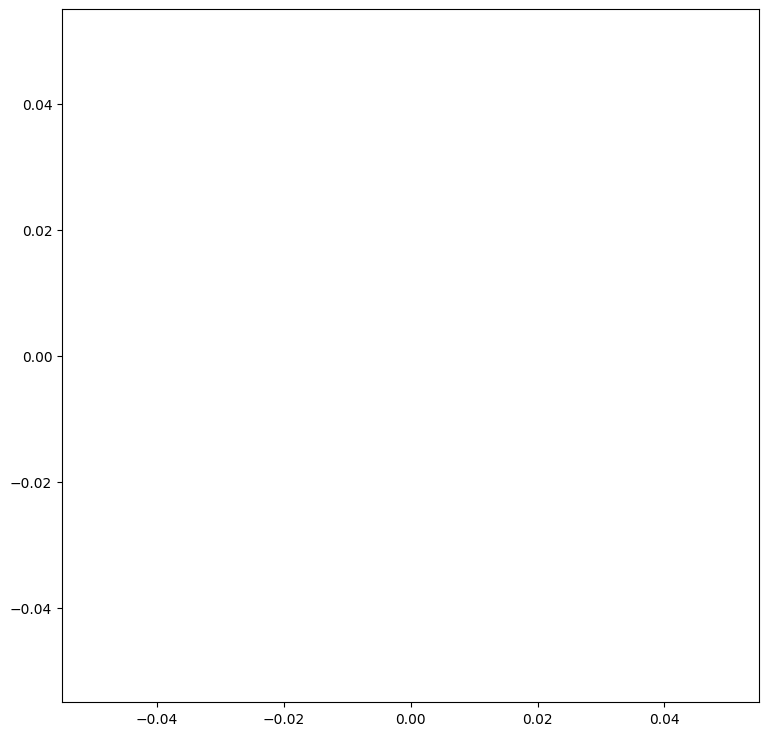

In [55]:
pdata = pdata[pdata.obs.Hyaluronan_score > 0].copy()
plt.figure(figsize=(9, 9))
sns.kdeplot(x=pdata.obsm['spatial'][:, 0], y=pdata.obsm['spatial'][:, 1], weights=pdata.obs['Hyaluronan_score'], bw_adjust=0.4, fill=True)
plt.gca().invert_yaxis()
plt.title('Hyaluronan Synthesis and Export Score')
# norm = plt.Normalize(vmin=pdata.obs['Hyaluronan_score'].min(), vmax=pdata.obs['Hyaluronan_score'].max())
# sm = plt.cm.ScalarMappable(cmap="Blues", norm=norm)
# sm.set_array([])
# plt.colorbar(sm, ax=scatter.axes)
plt.show()

In [5]:
pval_cutoff = 0.01
top_n = 200

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    filtered_data = data[data['padj'] < 0.01]
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

degs = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('DEG.csv', index=False, sep="\t")
top_genes_df

,Gene,Log2FoldChange,padj,score,Cluster
0,Il31ra,1.698707,0.000000e+00,45.774677,0
1,Cd44,1.405137,0.000000e+00,43.589825,0
2,Malat1,1.234776,0.000000e+00,42.706799,0
3,Hexb,0.913633,2.934200e-306,38.552090,0
4,Camk1d,1.695040,4.706520e-295,37.549950,0
...,...,...,...,...,...
2395,Rcc2,0.234920,1.597286e-37,13.050844,11
2396,Patz1,0.461876,2.042954e-37,13.041139,11
2397,Cxxc5,0.300682,2.714173e-37,13.014336,11
2398,Nudcd2,0.375864,4.427105e-37,12.979486,11


In [479]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene               object
Log2FoldChange    float64
padj              float64
score             float64
Cluster             int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 643
Enrichment analysis for list 1 completed successfully: 642
Enrichment analysis for list 2 completed successfully: 725
Enrichment analysis for list 3 completed successfully: 683
Enrichment analysis for list 4 completed successfully: 714
Enrichment analysis for list 5 completed successfully: 354
Enrichment analysis for list 6 completed successfully: 588
Enrichment analysis for list 7 completed successfully: 585
Enrichment analysis for list 8 completed successfully: 381
Enrichment analysis for list 9 completed successfully: 358
Enrichment analysis for list 10 completed successfully: 486
Enrichment analysis for list 11 completed successfully: 719



In [6]:
for i in range(12):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Combined Score"] > 50]
    #results[["Name", "ID"]] = results["Term"].str.extract(r'(.+?) \((GO:\d+)\)')
    #results = results.iloc[:, [-1, -2, -3, -4]]
    results = results.iloc[:, [1, -1]]
    results["Cluster"] = i
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df.Term = go_df.Term.str.split("R-HSA").str.get(0)
go_df = go_df[go_df.Genes.str.split(';').apply(len) > 1]

def to_mouse_gene(gene_list):
    return [gene[0] + str(gene[1:]).lower() for gene in gene_list]
go_df.Genes = go_df.Genes.str.split(';').apply(to_mouse_gene)
go_df.reset_index(drop=True, inplace=True)

In [7]:
CLUSTER = 4
MARKER = '2-1'

mask = (gdata.obs.marker == MARKER) & (gdata.obs.cluster == CLUSTER)
guide_vec = gdata[mask, 'sgCd44'].X.flatten()
ntc_vec = gdata[mask, 'sgnon-targeting'].X.flatten()
pos_vec = gdata[mask, 'sgZc3h12a'].X.flatten()

pdata = fdata[mask].copy()
from tqdm import tqdm

pdf = pd.DataFrame(columns=['sgCd44', 'sgNTC', 'sgZc3h12a'])
rdf = pd.DataFrame(columns=['sgCd44', 'sgNTC', 'sgZc3h12a'])
for pathway in tqdm(go_df[go_df.Cluster == CLUSTER].index):
    go_vec = pdata[:, go_df.loc[pathway, 'Genes']].X.sum(axis=1)
    
    df = pd.DataFrame({
        'sgCd44': spearmanr(guide_vec, go_vec).pvalue,
        'sgNTC': spearmanr(ntc_vec, go_vec).pvalue,
        'sgZc3h12a': spearmanr(pos_vec, go_vec).pvalue
    }, index=[go_df.loc[pathway, 'Term']])
    pdf = pd.concat([pdf, df], axis=0)
    
    df = pd.DataFrame({
        'sgCd44': spearmanr(guide_vec, go_vec).statistic,
        'sgNTC': spearmanr(ntc_vec, go_vec).statistic,
        'sgZc3h12a': spearmanr(pos_vec, go_vec).statistic
    }, index=[go_df.loc[pathway, 'Term']])
    rdf = pd.concat([rdf, df], axis=0)
# pdf = pdf.map(lambda x: '**' if x < 0.05 else ('*' if x < 0.1 else ''))

plt.figure(figsize=(6, 18))
ax = sns.heatmap(rdf, cmap='RdBu_r', annot=pdf, fmt='.2f', cbar_kws={'shrink': 0.9, 'aspect': 16})
# Customize the y-tick labels
for tick_label in ax.get_yticklabels():
    label_text = tick_label.get_text()
    if 'Col' in label_text or 'Patt' in label_text or 'Fib' in label_text:
        tick_label.set_color('red')
    elif 'Eff' in label_text:
        tick_label.set_color('blue')
ax.figure.canvas.draw()
 
plt.title("Pearson Correlation with Reactome Term")
plt.text(
    x=1.03, y=0.98, 
    s="** p < 0.01\n*   p < 0.05", 
    ha='left', va='top', 
    transform=ax.transAxes, fontsize=12,
    bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
)
plt.show()

AttributeError: 'DataFrame' object has no attribute 'cluster'

<Figure size 600x1800 with 0 Axes>

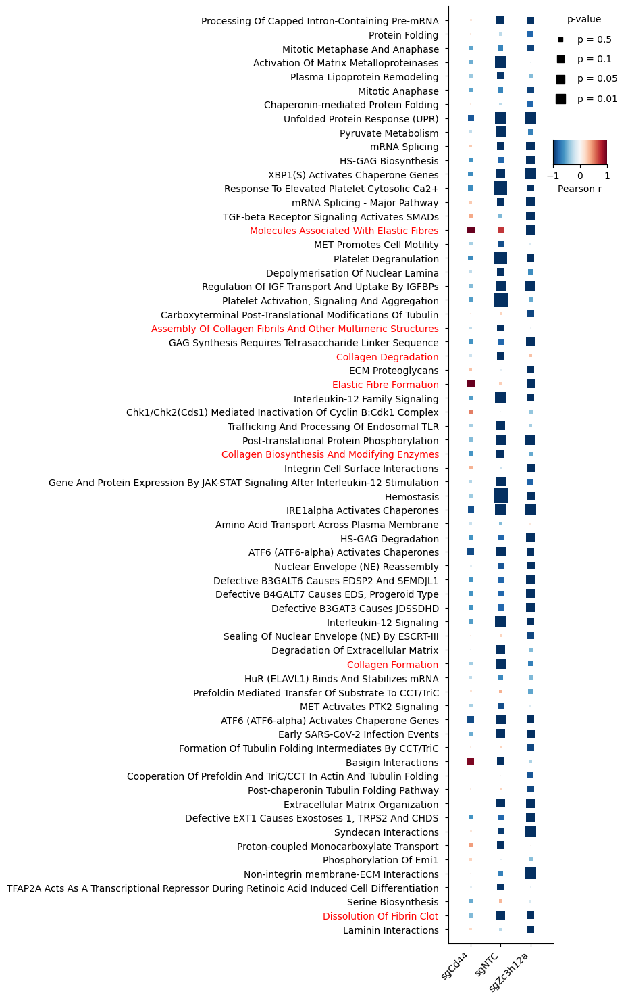

In [111]:
from matplotlib import patches
plt.figure(figsize=(6, 18))

# 设置背景为白色
fig, ax = plt.subplots(figsize=(2, 18))
ax.set_facecolor('white')

# 生成样例数据
# 假设 rdf 是 Pearson 相关性矩阵，pdf 是对应的 p-value 矩阵
# cmap='RdBu_r' 用于设置颜色映射方案

# 遍历所有元素，绘制方形点，大小表示p-value，颜色表示Pearson相关系数
for i in range(rdf.shape[0]):
    for j in range(rdf.shape[1]):
        # 获取Pearson相关性和p-value
        correlation = rdf.iloc[i, j]
        p_value = pdf.iloc[i, j]

        # 计算点的大小，p值越小点越大
        size = -np.log10(p_value) * 50  # 调整系数以控制大小
        # 设置点的颜色，依照Pearson相关系数
        color = plt.cm.RdBu_r((correlation * 20 + 1) / 2) # 将相关性从[-1, 1]映射到[0, 1]
        
        # 绘制方形点
        ax.scatter((j-1)*0.2+1, i, s=size, color=color, marker='s', edgecolor='none')

# 设置x轴和y轴标签
ax.set_xticks(np.arange(rdf.shape[1]))
ax.set_xticklabels(rdf.columns, rotation=90)
ax.set_yticks(np.arange(rdf.shape[0]))
ax.set_yticklabels(rdf.index)

# 自定义y轴标签颜色
for tick_label in ax.get_yticklabels():
    label_text = tick_label.get_text()
    if 'Col' in label_text or 'Patt' in label_text or 'Fib' in label_text:
        tick_label.set_color('red')
    elif 'Eff' in label_text:
        tick_label.set_color('blue')

plt.xticks([0.8, 1, 1.2])
ax.set_xticklabels(['sgCd44', 'sgNTC', 'sgZc3h12a'], rotation=45, ha='right')

# 添加横向colorbar
cax = fig.add_axes([0.9, 0.75, 0.4, 0.02])  # 控制colorbar的位置
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=plt.Normalize(vmin=-1, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.3)  # 横向放置并缩小
cbar.set_label('Pearson r')

# 去除colorbar的外边框
cbar.outline.set_visible(False)

# 添加p_value的大小图例，使用不同大小的黑色点表示
legend_p_values = [0.5, 0.1, 0.05, 0.01]
legend_sizes = [-np.log10(p) * 50 for p in legend_p_values]

# 创建图例的散点标记
for i, (p_val, size) in enumerate(zip(legend_p_values, legend_sizes)):
    ax.scatter([], [], s=size, color='black', marker='s', label=f'p = {p_val}')

# 显示图例
ax.legend(loc='upper right', title='p-value', bbox_to_anchor=(1.7, 1), frameon=False, labelspacing=1.1)

sns.despine()

ax.set_xlim([0.65, 1.35])
ax.set_ylim([-1, rdf.shape[0]])

# 显示图形
plt.show()

In [650]:
CLUSTER = 4
MARKER = '2-1'

mask = (gdata.obs.marker == MARKER) & (gdata.obs.cluster == CLUSTER)
pdata = gdata[mask].copy()

# pdf = pd.DataFrame(columns=['sgCd44', 'sgNTC', 'sgZc3h12a'])
expr_df = pd.DataFrame(columns=['expression_score', 'guide_count', 'guide', 'pathway'])
# l2fc_df = pd.DataFrame(columns=['sgCd44', 'sgZc3h12a'])
for pathway in tqdm(go_df[go_df.Cluster == CLUSTER].index):
    pdata.obs['gene_sum'] = fdata[mask, go_df.loc[pathway].Genes].X.sum(axis=1)
    guide_data = pdata[pdata[:, 'sgCd44'].X.flatten() > 0]
    ntc_data = pdata[pdata[:, 'sgnon-targeting'].X.flatten() > 0]
    pos_data = pdata[pdata[:, 'sgZc3h12a'].X.flatten() > 0]

    guide_df = pd.DataFrame({
        'expression_score': guide_data.obs.gene_sum.tolist(),
        'guide_count': guide_data[:, 'sgCd44'].X.flatten(),
        'guide': ['sgCd44'] * guide_data.shape[0],
        'pathway': [pathway] * guide_data.shape[0]
    })
    ntc_df = pd.DataFrame({
        'expression_score': ntc_data.obs.gene_sum.tolist(),
        'guide_count': ntc_data[:, 'sgnon-targeting'].X.flatten(),
        'guide': ['sgnon-targeting'] * ntc_data.shape[0],
        'pathway': [pathway] * ntc_data.shape[0]
    })
    pos_df = pd.DataFrame({
        'expression_score': pos_data.obs.gene_sum.tolist(),
        'guide_count': pos_data[:, 'sgZc3h12a'].X.flatten(),
        'guide': ['sgZc3h12a'] * pos_data.shape[0],
        'pathway': [pathway] * pos_data.shape[0]
    })
    
    expr_df = pd.concat([expr_df, guide_df, ntc_df, pos_df], axis=0)
expr_df.pathway = expr_df.pathway.map(lambda x: go_df.loc[x].Term)

  0%|          | 0/66 [00:00<?, ?it/s]

100%|██████████| 66/66 [00:01<00:00, 33.92it/s]


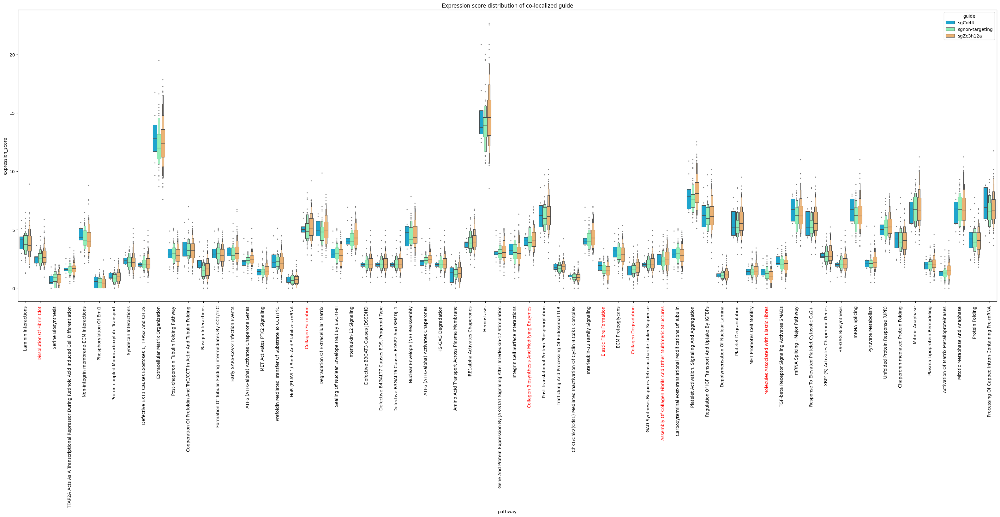

In [663]:
plt.figure(figsize=(40, 12))
ax = sns.boxenplot(expr_df, x='pathway', y='expression_score', hue='guide', palette='rainbow', flier_kws={'s': 2})
plt.xticks(rotation=90)
for tick_label in ax.get_xticklabels():
    label_text = tick_label.get_text()
    if 'Col' in label_text or 'Patt' in label_text or 'Fib' in label_text:
        tick_label.set_color('red')
    elif 'Eff' in label_text:
        tick_label.set_color('blue')
ax.figure.canvas.draw()
plt.title('Expression score distribution of co-localized guide')
plt.show()

# Weighted DEG

In [7]:
annotation_guide = sc.read_h5ad('./RNA/Multitime.filtered.guide.bin20.h5')

In [8]:
def align_gdata_filtered(fdata, gdata, bin_size=100):
    gdata.obs.marker = gdata.obs.marker.map({
        'B926-1': '2-1',
        'B926-2': '2-2',
        'B924-1': '1-1',
        'B924-2': '1-2',
        'B922-1': '3-1',
        'B922-2': '3-2'
    })
    fdata.obs['coord_x'] = fdata.obsm['spatial'][:, 0] // bin_size * bin_size
    fdata.obs['coord_y'] = fdata.obsm['spatial'][:, 1] // bin_size * bin_size

    gdata.obs['coord_x'] = gdata.obsm['spatial'][:, 0] // bin_size * bin_size
    gdata.obs['coord_y'] = gdata.obsm['spatial'][:, 1] // bin_size * bin_size
    fdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(fdata.obs['marker'], fdata.obs['coord_x'], fdata.obs['coord_y'])]
    gdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(gdata.obs['marker'], gdata.obs['coord_x'], gdata.obs['coord_y'])]

    common_bins = np.intersect1d(fdata.obs_names, gdata.obs_names)
    fdata = fdata[common_bins].copy()
    gdata = gdata[common_bins].copy()
    return fdata, gdata

annotation, annotation_guide = align_gdata_filtered(annotation, annotation_guide, 20)

In [9]:
annotation_guide = utils.combine_guide_replicates(annotation_guide)

In [10]:
guide_data = annotation[(annotation_guide[:, 'sgCd44'].X > 0) & (annotation_guide[:, 'sgnon-targeting'].X == 0) & (annotation_guide[:, 'sgGata3'].X == 0)].copy()
ntc_data = annotation[(annotation_guide[:, 'sgCd44'].X == 0) & (annotation_guide[:, 'sgnon-targeting'].X > 0) & (annotation_guide[:, 'sgGata3'].X == 0)].copy()
pos_data = annotation[(annotation_guide[:, 'sgCd44'].X == 0) & (annotation_guide[:, 'sgnon-targeting'].X == 0) & (annotation_guide[:, 'sgGata3'].X > 0)].copy()

In [11]:
guide_data = fdata[(gdata[:, 'sgCd44'].X > 0) & (gdata[:, 'sgnon-targeting'].X == 0) & (gdata[:, 'sgGata3'].X == 0)].copy()
ntc_data = fdata[(gdata[:, 'sgCd44'].X == 0) & (gdata[:, 'sgnon-targeting'].X > 0) & (gdata[:, 'sgGata3'].X == 0)].copy()
pos_data = fdata[(gdata[:, 'sgCd44'].X == 0) & (gdata[:, 'sgnon-targeting'].X == 0) & (gdata[:, 'sgGata3'].X > 0)].copy()

In [12]:
import anndata as ad
guide_data.obs['guide'] = 'sgCd44'
ntc_data.obs['guide'] = 'Control'
pos_data.obs['guide'] = 'sgGata3'
# cdata = ad.concat([guide_data, ntc_data, pos_data])
cdata = ad.concat([guide_data, ntc_data])
# cdata = cdata[cdata.obs.marker == '2-1',:].copy()

In [46]:
sc.pp.normalize_total(cdata, target_sum=1e4)
sc.pp.log1p(cdata)

In [13]:
sc.tl.rank_genes_groups(cdata, groupby='guide', method='t-test')

In [14]:
pval_cutoff = 1
top_n = 300000

result = cdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    filtered_data = data[data['padj'] < pval_cutoff]
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('./deg.csv', index=None, sep='\t')
top_genes_df[top_genes_df.Gene == 'Spp1']

,Gene,Log2FoldChange,padj,score,Cluster
7,Spp1,0.540891,6.195374e-08,6.735725,Control
26156,Spp1,-0.540891,6.195374e-08,-6.735725,sgCd44


In [15]:
genes = np.unique(sc.get.rank_genes_groups_df(cdata, group='sgCd44').head(12).names.tolist() + sc.get.rank_genes_groups_df(cdata, group='Control').head(12).names.tolist())

In [57]:
ntc_df = sc.get.rank_genes_groups_df(cdata, group='Control').loc[np.isin(sc.get.rank_genes_groups_df(cdata, group='Control').names, genes), :][['names', 'logfoldchanges']].set_index('names')
ntc_df.columns = ['Control']
guide_df = sc.get.rank_genes_groups_df(cdata, group='sgCd44').loc[np.isin(sc.get.rank_genes_groups_df(cdata, group='sgCd44').names, genes), :][['names', 'logfoldchanges']].set_index('names')
guide_df.columns = ['sgCd44']
l2fc_df = pd.concat([ntc_df, guide_df], axis=1)

ntc_df = sc.get.rank_genes_groups_df(cdata, group='Control').loc[np.isin(sc.get.rank_genes_groups_df(cdata, group='Control').names, genes), :][['names', 'pvals_adj']].set_index('names')
ntc_df.columns = ['Control']
guide_df = sc.get.rank_genes_groups_df(cdata, group='sgCd44').loc[np.isin(sc.get.rank_genes_groups_df(cdata, group='sgCd44').names, genes), :][['names', 'pvals_adj']].set_index('names')
guide_df.columns = ['sgCd44']
p_df = pd.concat([ntc_df, guide_df], axis=1)

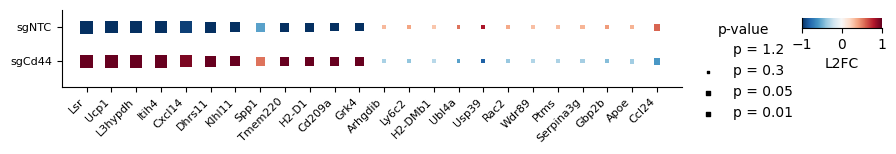

In [58]:
from matplotlib import patches
# plt.figure(figsize=(6, 6))

# 设置背景为白色
fig, ax = plt.subplots(figsize=(8, 1))
ax.set_facecolor('white')

# 生成样例数据
# 假设 l2fc_df 是 Pearson 相关性矩阵，p_df 是对应的 p-value 矩阵
# cmap='RdBu_r' 用于设置颜色映射方案

# 遍历所有元素，绘制方形点，大小表示p-value，颜色表示Pearson相关系数
for i in range(l2fc_df.shape[0]):
    for j in range(l2fc_df.shape[1]):
        # 获取Pearson相关性和p-value
        correlation = l2fc_df.iloc[i, j]
        p_value = p_df.iloc[i, j]

        # 计算点的大小，p值越小点越大
        size = -np.log10(p_value) * 6  # 调整系数以控制大小
        # 设置点的颜色，依照Pearson相关系数
        color = plt.cm.RdBu_r((correlation + 1) / 2) # 将相关性从[-1, 1]映射到[0, 1]
        
        # 绘制方形点
        ax.scatter(i, (j-1)*0.2+1, s=size, color=color, marker='s', edgecolor='none')

# 设置x轴和y轴标签
ax.set_yticks(np.arange(l2fc_df.shape[1]))
ax.set_yticklabels(l2fc_df.columns, rotation=90)
ax.set_xticks(np.arange(l2fc_df.shape[0]))
ax.set_xticklabels(l2fc_df.index)

# 自定义y轴标签颜色
for tick_label in ax.get_xticklabels():
    label_text = tick_label.get_text()
    if 'Col' in label_text or 'Patt' in label_text or 'Fib' in label_text:
        tick_label.set_color('red')
    elif 'Eff' in label_text:
        tick_label.set_color('blue')

plt.yticks([0.8, 1])
ax.set_yticklabels(['sgCd44', 'sgNTC'], rotation=0, ha='right', size=8)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', size=8)

# 添加横向colorbar
cax = fig.add_axes([1.05, 0.7, 0.1, 0.1])  # 控制colorbar的位置
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=plt.Normalize(vmin=-1, vmax=1))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.3)  # 横向放置并缩小
cbar.set_label('L2FC')

# 去除colorbar的外边框
cbar.outline.set_visible(False)

# 添加p_value的大小图例，使用不同大小的黑色点表示
legend_p_values = [1.2, 0.3, 0.05, 0.01]
legend_sizes = [-np.log10(p) * 6 for p in legend_p_values]

# 创建图例的散点标记
for i, (p_val, size) in enumerate(zip(legend_p_values, legend_sizes)):
    ax.scatter([], [], s=size, color='black', marker='s', label=f'p = {p_val}')

# 显示图例
ax.legend(loc='upper right', title='p-value', bbox_to_anchor=(1.2, 1), frameon=False, labelspacing=0.5)

sns.despine()

ax.set_ylim([0.65, 1.1])
ax.set_xlim([-1, l2fc_df.shape[0]])

ax.set_xticklabels(l2fc_df.index, size=8)

# 显示图形

# plt.rcParams['pdf.fonttype']=42
# plt.savefig("./plots/deg_in_guide_bin_cd44.pdf", format="pdf", bbox_inches='tight')

plt.show()

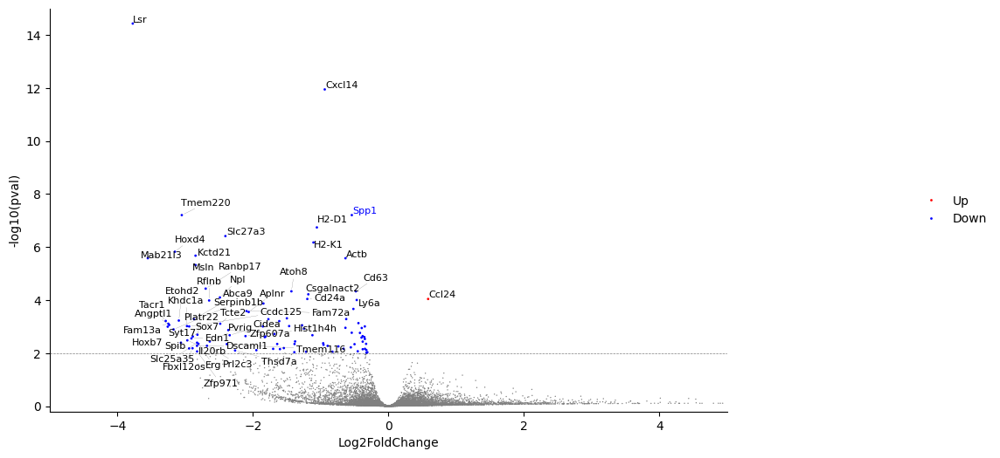

In [16]:
pval_cutoff = 1
# top_n = 300000

result = cdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    # filtered_data = data[data['padj'] < pval_cutoff]
    sorted_data = data.sort_values(by='score', ascending=False)
    # top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, sorted_data], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('./deg.csv', index=None, sep='\t')
top_genes_df[top_genes_df.Gene == 'Spp1']

plot_df = top_genes_df[top_genes_df.Cluster == 'sgCd44']
plot_df['-log10(pval)'] = -np.log10(plot_df.padj)

plot_df['sig'] = ['Up' if l2fc > 0 and p_value < 0.01 else ('Down' if l2fc < 0 and p_value < 0.01 else 'Not Significant')
                  for p_value, l2fc in zip(plot_df.padj, plot_df.Log2FoldChange)]
plot_df['size'] = [1 if sig == 'Up' else (2 if sig == 'Down' else 0) for sig in plot_df.sig]

plot_df = plot_df[(plot_df['-log10(pval)'] < 15) & (plot_df['Log2FoldChange'] > -5) & (plot_df['Log2FoldChange'] < 5)]

plt.figure(figsize=(10, 6))
sns.scatterplot(y='-log10(pval)', x='Log2FoldChange', data=plot_df[plot_df.sig == 'Not Significant'], s=1, legend=True, color='gray', edgecolor='none')
sns.scatterplot(y='-log10(pval)', x='Log2FoldChange', data=plot_df[plot_df.sig != 'Not Significant'], s=4, hue='sig', legend=True, palette=['red', 'blue'], edgecolor='none')

# 标注出sig为Up或Down的gene名
from adjustText import adjust_text

texts = []
for i in range(len(plot_df)):
    if plot_df['sig'].iloc[i] in ['Down'] and (plot_df['-log10(pval)'].iloc[i] > 4 or plot_df['Log2FoldChange'].iloc[i] < -2) or plot_df['sig'].iloc[i] in ['Up']:
        gene_name = plot_df['Gene'].iloc[i]
        color = 'blue' if gene_name == 'Spp1' else 'black'
        texts.append(plt.text(plot_df['Log2FoldChange'].iloc[i], 
                               plot_df['-log10(pval)'].iloc[i], 
                               gene_name, 
                               fontsize=8, 
                               color=color))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', linewidth=0.1))
plt.hlines(y=2, xmin=-5, xmax=5, color='black', linestyle='--', alpha=0.5, linewidth=0.5)
plt.legend(title='', loc='right', bbox_to_anchor=(1.4, 0.5), frameon=False, labelspacing=0.5)

plt.xlim([-5, 5])
plt.ylim([-0.2, 15])
sns.despine()
plt.show()

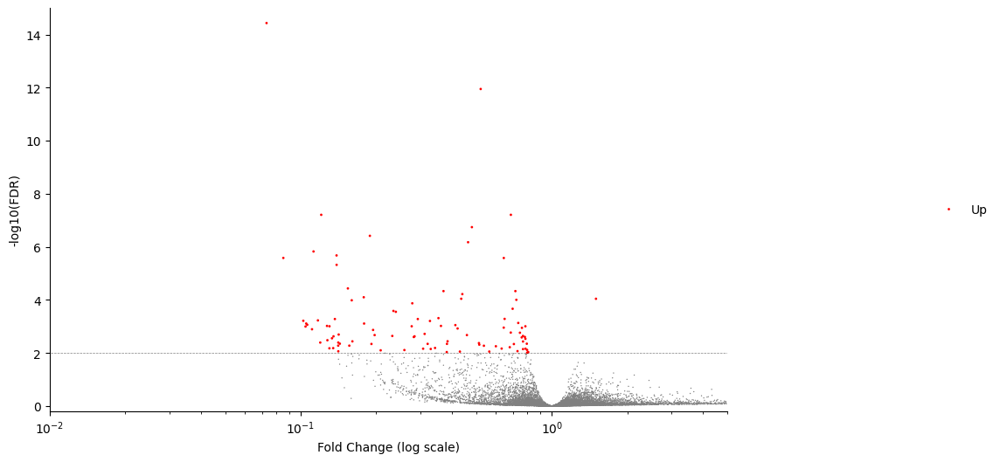

In [70]:
pval_cutoff = 1
# top_n = 300000

result = cdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    fc = 2 ** result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'FoldChange': fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    # filtered_data = data[data['padj'] < pval_cutoff]
    sorted_data = data.sort_values(by='score', ascending=False)
    # top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, sorted_data], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('./deg.csv', index=None, sep='\t')
top_genes_df[top_genes_df.Gene == 'Spp1']

plot_df = top_genes_df[top_genes_df.Cluster == 'sgCd44']
plot_df['-log10(FDR)'] = -np.log10(plot_df.padj)  # 改为FDR

plot_df['sig'] = ['Up' if l2fc > 0 and p_value < 0.01 else ('Down' if l2fc < 0 and p_value < 0.01 else 'Not Significant')
                  for p_value, l2fc in zip(plot_df.padj, plot_df.FoldChange)]
plot_df['size'] = [1 if sig == 'Up' else (2 if sig == 'Down' else 0) for sig in plot_df.sig]

plot_df = plot_df[(plot_df['-log10(FDR)'] < 15) & (plot_df['FoldChange'] > 1e-4) & (plot_df['FoldChange'] < 5)]

plt.figure(figsize=(10, 6))
sns.scatterplot(y='-log10(FDR)', x='FoldChange', data=plot_df[plot_df.sig == 'Not Significant'], s=1, legend=True, color='gray', edgecolor='none')
sns.scatterplot(y='-log10(FDR)', x='FoldChange', data=plot_df[plot_df.sig != 'Not Significant'], s=4, hue='sig', legend=True, palette=['red', 'blue'], edgecolor='none')

# 标注出sig为Up或Down的gene名
from adjustText import adjust_text

# texts = []
# for i in range(len(plot_df)):
#     if plot_df['sig'].iloc[i] in ['Down'] and (plot_df['-log10(FDR)'].iloc[i] > 4 or plot_df['FoldChange'].iloc[i] < 0.25) or plot_df['sig'].iloc[i] in ['Up']:
#         gene_name = plot_df['Gene'].iloc[i]
#         color = 'blue' if gene_name == 'Spp1' else 'black'
#         texts.append(plt.text(plot_df['FoldChange'].iloc[i], 
#                                plot_df['-log10(FDR)'].iloc[i], 
#                                gene_name, 
#                                fontsize=8, 
#                                color=color))

# adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', linewidth=0.1))
plt.hlines(y=2, xmin=-5, xmax=5, color='black', linestyle='--', alpha=0.5, linewidth=0.5)
plt.legend(title='', loc='right', bbox_to_anchor=(1.4, 0.5), frameon=False, labelspacing=0.5)

plt.xscale('log')
plt.xlim([1e-2, 5])

# plt.xlim([-5, 5])
plt.ylim([-0.2, 15])
plt.xlabel('Fold Change (log scale)')
plt.ylabel('-log10(FDR)')
sns.despine()
plt.show()

In [17]:
# 获取sgCd44和Control组的数据
from tqdm import tqdm

sgcd44_mask = cdata.obs.guide == 'sgCd44'
control_mask = cdata.obs.guide == 'Control'

# 将数据转换为浮点数类型
sgcd44_data = cdata[sgcd44_mask].X.astype(float) 
control_data = cdata[control_mask].X.astype(float)

# 计算每个基因在两组中的平均表达量
sgcd44_means = sgcd44_data.mean(axis=0)
control_means = control_data.mean(axis=0)

# 计算fold change
fc = (sgcd44_means + 1e-9) / (control_means + 1e-9)
log2fc = np.log2(fc)

# 进行t检验计算p值
from scipy import stats
pvals = []
for i in tqdm(range(cdata.n_vars)):
    sgcd44_expr = sgcd44_data[:, i].toarray().flatten()
    control_expr = control_data[:, i].toarray().flatten()
    _, p = stats.ttest_ind(sgcd44_expr, control_expr)
    pvals.append(p)

100%|██████████| 13177/13177 [04:36<00:00, 47.64it/s]


In [18]:
pvals = np.array(pvals)
pvals[np.isnan(pvals)] = 1

# FDR校正
from statsmodels.stats.multitest import fdrcorrection
_, fdr = fdrcorrection(pvals)

In [35]:
result_df = pd.read_csv('deg_manual.csv', sep='\t')

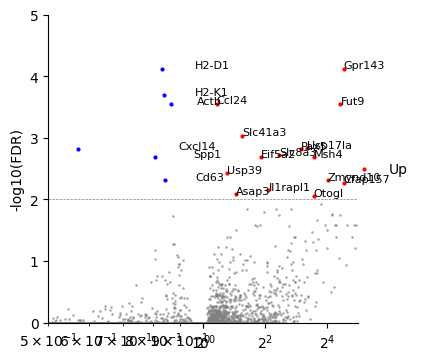

In [67]:
# 创建结果DataFrame
# result_df = pd.DataFrame({
#     'Gene': cdata.var_names,
#     'FC': np.array(fc).flatten(),
#     'FDR': fdr
# })

# 添加显著性标记
result_df['sig'] = 'Not Significant'
result_df.loc[(result_df.FC > 1) & (result_df.FDR < 0.01), 'sig'] = 'Up'
result_df.loc[(result_df.FC < 1) & (result_df.FDR < 0.01), 'sig'] = 'Down'

# 绘图
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(4, 4))


# 左边subplot (base 10)
# x < 1的点
mask_less = result_df.FC < 1
ax1.scatter(result_df[mask_less & (result_df.sig == 'Not Significant')].FC, 
           -np.log10(result_df[mask_less & (result_df.sig == 'Not Significant')].FDR),
           s=1, c='gray', alpha=0.5)
ax1.scatter(result_df[mask_less & (result_df.sig == 'Down')].FC,
           -np.log10(result_df[mask_less & (result_df.sig == 'Down')].FDR),
           s=4, c='blue', label='Down')

# x > 1的点
mask_greater = result_df.FC >= 1

ax2.scatter(result_df[mask_greater & (result_df.sig == 'Not Significant')].FC, 
           -np.log10(result_df[mask_greater & (result_df.sig == 'Not Significant')].FDR),
           s=1, c='gray', alpha=0.5)
ax2.scatter(result_df[mask_greater & (result_df.sig == 'Up')].FC,
           -np.log10(result_df[mask_greater & (result_df.sig == 'Up')].FDR),
           s=4, c='red', label='Up')

# 添加文本标注
texts1 = []
texts2 = []
for i in range(len(result_df)):
    if (result_df['sig'].iloc[i] in ['Down', 'Up']) and np.abs(np.log2(result_df['FC'].iloc[i])) < 5:
        gene_name = result_df['Gene'].iloc[i]
        fc = result_df['FC'].iloc[i]
        # texts1.append(ax1.text(fc, 
        #                      -np.log10(result_df['FDR'].iloc[i]), 
        #                      gene_name, 
        #                      fontsize=8))
        texts2.append(ax2.text(fc, 
                             -np.log10(result_df['FDR'].iloc[i]), 
                             gene_name, 
                             fontsize=8))

# 设置坐标轴
ax1.set_xscale('log', base=10)
ax2.set_xscale('log', base=2)

for ax in [ax1, ax2]:
    ax.axhline(y=-np.log10(0.01), color='black', linestyle='--', alpha=0.5, linewidth=0.5)
    # ax.axvline(x=1, color='black', linestyle='-', alpha=0.5, linewidth=0.5)
    # ax.set_xlabel('Fold Change')
    ax.set_ylim([-0, 5])
    ax.set_ylabel('-log10(FDR)')
    sns.despine(ax=ax)

ax1.set_xlim([0.5, 1])
ax2.set_xlim([1, 2**5])
sns.despine(ax=ax2, left=True)
ax2.set_yticks([])
ax2.set_ylabel('')

# 只在右边subplot显示图例
ax2.legend(frameon=False, loc='right', bbox_to_anchor=(1.4, 0.5))
plt.subplots_adjust(hspace=0, wspace=0)

plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/deg_manual.pdf", format="pdf", bbox_inches='tight')
plt.show()

In [13]:
df = sc.get.rank_genes_groups_df(cdata, group='sgCd44').sort_values(by='pvals_adj', ascending=True).head(2000)[['names', 'logfoldchanges']]
deg_df = df[df.logfoldchanges > 0].head(200)
ntc_df = df[df.logfoldchanges < 0].head(1000)
deg_df['Cluster'] = 0
ntc_df['Cluster'] = 1
cdf = pd.concat([deg_df, ntc_df])
cdf.columns = ['Gene', 'logfoldchanges', 'Cluster']
cdf.to_csv('./DEG.csv', index=None, sep='\t')

In [16]:
!sshpass -p wang2024 ssh wpy@172.16.10.103 "mamba run -n gsea python ~/stereoseq/20240502-SPACseq/enrich.py"

Gene               object
logfoldchanges    float64
Cluster             int64
dtype: object
/home/wpy/stereoseq/20240502-SPACseq/bin/go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
Enrichment analysis for list 0 completed successfully: 2146
Enrichment analysis for list 1 completed successfully: 4315



In [21]:
for i in range(2):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False)
    results = results[results["Adjusted P-value"] < 1]
    results = results.loc[:, ["Term", "Genes", "Adjusted P-value"]]
    results["Cluster"] = i
    results["Gene Counts"] = results["Genes"].str.split(";").apply(len)
    results["Term"] = results["Term"].str.split("R-HSA").str[0]
    results["Term"] = results["Term"].str.split(" \(").str[0]
    # results = results[results["Genes"].str.contains("Apoe", case=False)]  # 过滤Term中含有Macrophage关键字的
    results = results.groupby("Cluster", as_index=False).apply(lambda x: x.sort_values(by='Adjusted P-value')).reset_index(drop=True)
    if not i: go_df = results
    else: go_df = pd.concat([go_df, results], axis=0)
go_df.to_csv('./GO/Reactome.csv', index=None, sep='\t')
go_df = go_df[go_df['Gene Counts'] > 8]

In [24]:
# 筛选所有top_genes_df中pval < 0.1的gene
top_df = top_genes_df[top_genes_df.padj < 0.05]
# 对top_df中的gene，查找go_df的genes列含有的、GeneCounts最大的行
pathway_dict = {}
for gene in top_df.Gene:
    pathway_dict[gene] = go_df[go_df.Genes.str.contains(gene, case=False) & (go_df['Adjusted P-value'] < 0.5)].sort_values(by='Adjusted P-value', ascending=True)['Term'].head(1).tolist()
# 合并所有的pathway，并assign gene到pathway
pathway_dict = {k: v for k, v in pathway_dict.items() if len(v) > 0}

from collections import defaultdict

# 创建一个默认字典来存储反转后的路径字典
reversed_pathway_dict = defaultdict(list)

# 遍历原始的pathway_dict，将key和value反转
for key, values in pathway_dict.items():
    for value in values:
        reversed_pathway_dict[value].append(key)

# 将defaultdict转换为普通字典
reversed_pathway_dict = dict(reversed_pathway_dict)
reversed_pathway_dict = {k: v for k, v in reversed_pathway_dict.items() if len(v) > 1}


In [112]:
pathway_dict = {
    'Cytokin-cytokine signaling': ['Tnfsf15', 'Cxcl14', 'Il9r', 'Bmp5'],
    'Phagocytosis': ['H2-K1', 'H2-D1', 'Cd209a', 'Dync1l1'],
    'Lipid Transportation': ['Abca9', 'Slc27a3', 'Pla2g3', 'Slc3a1', 'Slc9a7', 'Ucp1', 'Lsr', 'Best1', 'Psma8'],
    'Hemostasis': ['Cd63', 'Itih4', 'Dock3', 'Egf', 'Sgpp2', 'Cd24a', 'Il9r'],
    'Apoptosis': ['Pla2g3', 'Pou3f3', 'gata4', 'Gls2', 'Actb'],
    'Cytokine stimulus': ['Ccl24', 'Csf3r', 'Irf5', 'Tcf7']
}

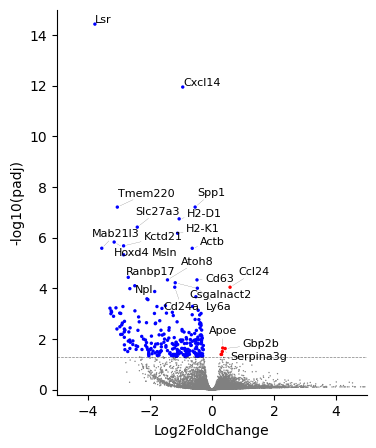

In [41]:
pval_cutoff = 1
# top_n = 300000

result = cdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    # filtered_data = data[data['padj'] < pval_cutoff]
    sorted_data = data.sort_values(by='score', ascending=False)
    # top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, sorted_data], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('./deg.csv', index=None, sep='\t')

plot_df = top_genes_df[top_genes_df.Cluster == 'sgCd44']
plot_df['-log10(pval)'] = -np.log10(plot_df.padj)

plot_df['sig'] = ['Up' if l2fc > 0 and p_value < 0.05 else ('Down' if l2fc < 0 and p_value < 0.05 else 'Not Significant')
                  for p_value, l2fc in zip(plot_df.padj, plot_df.Log2FoldChange)]
plot_df['size'] = [1 if sig == 'Up' else (2 if sig == 'Down' else 0) for sig in plot_df.sig]

plot_df = plot_df[(plot_df['-log10(pval)'] < 15) & (plot_df['Log2FoldChange'] > -5) & (plot_df['Log2FoldChange'] < 5)]

plt.figure(figsize=(4, 5))
sns.scatterplot(y='-log10(pval)', x='Log2FoldChange', data=plot_df[plot_df.sig == 'Not Significant'], s=1, legend=True, color='gray', edgecolor='none')

# 为每个pathway生成一个独特的颜色
unique_colors = sns.color_palette("tab20b", len(reversed_pathway_dict))
special_colors = {gene: unique_colors[i] for i, (_, genes) in enumerate(reversed_pathway_dict.items()) for gene in genes}

# 绘制特殊染色的基因
sns.scatterplot(y='-log10(pval)', x='Log2FoldChange', data=plot_df[plot_df.sig != 'Not Significant'], 
                s=6, hue='sig', legend=False, palette=['red', 'blue'], edgecolor='none')

# for pathway, genes in reversed_pathway_dict.items():
#     if pathway.lower() in ['phagosome', 'extracellular structure organization',
#                    'vascular smooth muscle contraction', 'cell adhesion molecules',
#                    'tgf-beta signaling pathway', 'regulation of angiogenesis',
#                    'ion channel transport']:
#         sns.scatterplot(y='-log10(pval)', x='Log2FoldChange', data=plot_df[plot_df.Gene.isin(genes)], 
#                         s=8, color=special_colors[genes[0]], edgecolor='none', label=pathway)

# 标注出sig为Up或Down的gene名
from adjustText import adjust_text

texts = []
for i in range(len(plot_df)):
    if plot_df['sig'].iloc[i] in ['Down'] and (plot_df['-log10(pval)'].iloc[i] > 4) or plot_df['sig'].iloc[i] in ['Up'] and (plot_df['-log10(pval)'].iloc[i] > 1.5):
        gene_name = plot_df['Gene'].iloc[i]
        # color = special_colors.get(gene_name, 'black')  # 使用特殊颜色
        texts.append(plt.text(plot_df['Log2FoldChange'].iloc[i], 
                               plot_df['-log10(pval)'].iloc[i], 
                               gene_name, 
                               fontsize=8, 
                               color='black'))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='black', linewidth=0.1))
plt.hlines(y=-np.log10(0.05), xmin=-5, xmax=5, color='black', linestyle='--', alpha=0.5, linewidth=0.5)
# plt.legend(title='Pathway', loc='upper center', bbox_to_anchor=(2, 0.2), frameon=False, labelspacing=0.1, ncol=1, fontsize=7)

plt.xlim([-5, 5])
plt.ylim([-0.2, 15])
plt.ylabel('-log10(padj)')
sns.despine()
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/volcano_cd44_deg.pdf", format="pdf", bbox_inches='tight')
plt.show()

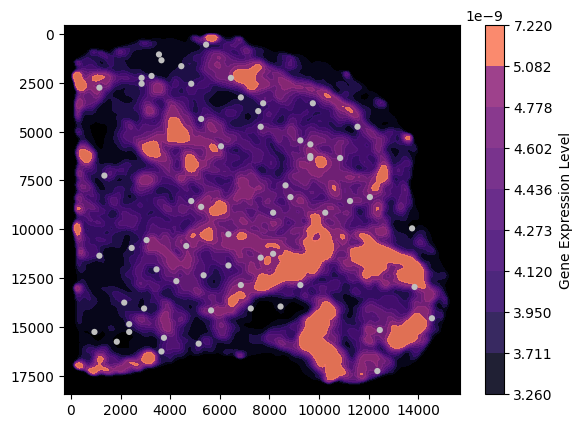

In [59]:
plot_data = fdata[fdata.obs.marker == '2-1']
plot_guide_data = gdata[gdata.obs.marker == '2-1']

scatter = sns.kdeplot(x=plot_data.obsm['spatial'][:, 0], y=plot_data.obsm['spatial'][:, 1],
                weights=plot_data[:, plot_df[plot_df.sig == 'Up'].Gene.tolist()].X.toarray().sum(axis=1),
                cmap='magma', bw_adjust=0.2, alpha=0.9, fill=True)

scatter.set_facecolor('black')
sns.scatterplot(x=plot_guide_data.obsm['spatial'][:, 0], y=plot_guide_data.obsm['spatial'][:, 1],
                s=plot_guide_data[:, 'sgCd44'].X.toarray().flatten() * 20,
                color='silver', edgecolor='none')

# 添加颜色条
norm = plt.Normalize(vmin=plot_data[:, plot_df[plot_df.sig == 'Up'].Gene.tolist()].X.toarray().sum(axis=1).min(),
                     vmax=plot_data[:, plot_df[plot_df.sig == 'Up'].Gene.tolist()].X.toarray().sum(axis=1).max())
cbar = plt.colorbar(scatter.collections[0], ax=scatter, orientation='vertical')
cbar.set_label('Gene Expression Level')
plt.gca().invert_yaxis()
plt.show()


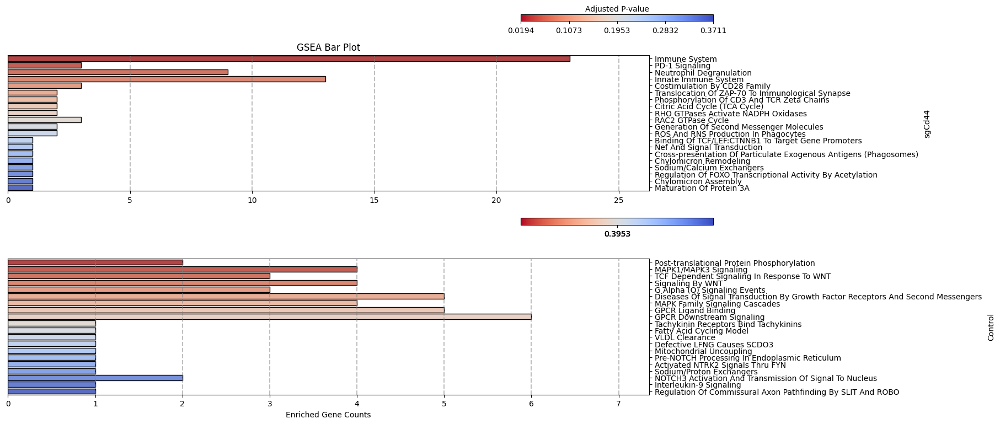

In [101]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(2, 1, figsize=(15, 8))
for cluster in range(2):
    gsea_results = go_df[go_df["Cluster"] == cluster][:20]

    barplot = sns.barplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results, 
        palette="coolwarm_r",
        edgecolor='black',
        ax=ax[cluster]
    )
    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5)

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="coolwarm_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.1, 0.3, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="Adjusted P-value", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.1)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=5)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.4f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    ax[cluster].set_xlabel('')

ax[0].set_ylabel(f'sgCd44')
ax[1].set_ylabel(f'Control')
plt.subplots_adjust(hspace=0.5)
ax[0].set_title('GSEA Bar Plot')
ax[1].set_xlabel('Enriched Gene Counts')
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/go_in_guide_bin_cd44.pdf", format="pdf", bbox_inches='tight')
plt.show()

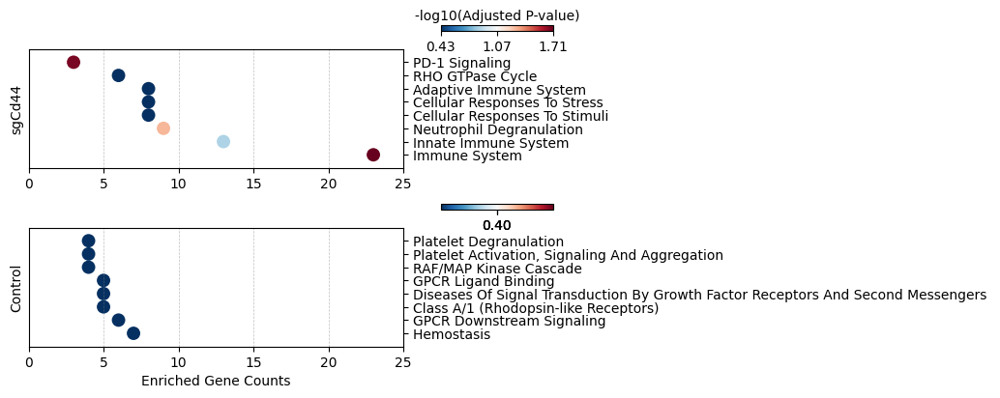

In [113]:
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(2, 1, figsize=(5, 4))
for cluster in range(2):
    gsea_results = go_df[go_df["Cluster"] == cluster].sort_values(by='Gene Counts', ascending=False)[:8]
    gsea_results['Adjusted P-value'] = -np.log10(gsea_results['Adjusted P-value'])

    barplot = sns.scatterplot(
        x='Gene Counts', 
        y='Term', 
        data=gsea_results,
        hue='Adjusted P-value',
        palette="RdBu_r",
        edgecolor='none',
        ax=ax[cluster],
        legend=False,
        s=100,
    )

    norm = plt.Normalize(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max())
    sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
    sm.set_array([])
    cax = inset_axes(ax[cluster], width="30%", height="5%", loc='upper right',
                     bbox_to_anchor=(0.4, 0.2, 1, 1), bbox_transform=ax[cluster].transAxes, borderpad=0)
    if cluster == 0:
        cbar = fig.colorbar(sm, cax=cax, label="-log10(Adjusted P-value)", orientation='horizontal', shrink=0.1)
        cbar.ax.xaxis.set_label_position('top')
    else: cbar = fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.05)

    cbar_ticks = np.linspace(gsea_results['Adjusted P-value'].min(), gsea_results['Adjusted P-value'].max(), num=3)  # Adjust num for density
    cbar.set_ticks(cbar_ticks)
    cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[cluster].yaxis.tick_right()
    ax[cluster].yaxis.set_label_position('right')

    for tick in ax[cluster].get_yticklabels():
        tick.set_fontsize(10)  # 设置yticklabel文字大小为12

    ax[cluster].set_xlabel('')
    # ax[cluster].set_ylabel(f'Cluster {cluster}')
    if cluster == 0: ax[cluster].set_ylabel(f'sgCd44')
    else: ax[cluster].set_ylabel(f'Control')
    ax[cluster].yaxis.set_label_position('left')
    ax[cluster].set_ylim([-1, 8])
    ax[cluster].set_xlim([0, 25])
    ax[cluster].sharex(ax[0])

    for tick in ax[cluster].get_xticks():
        ax[cluster].axvline(x=tick, linestyle='--', color='gray', alpha=0.5, linewidth=0.5)

plt.subplots_adjust(hspace=0.5)
# ax[0].set_title('GSEA Bar Plot')
ax[1].set_xlabel('Enriched Gene Counts')
plt.rcParams['pdf.fonttype']=42
plt.savefig("./plots/nmf_programs_gsea.pdf", format="pdf", bbox_inches='tight')
plt.show()

# Macrophage Subtype

In [9]:
def mouse_gene(gene_list):
    return [gene[0] + gene[1:].lower() for gene in gene_list]

M1_SIGNATURE = mouse_gene(["IL23", "TNF", "CXCL9", "CXCL10", "CXCL11", "CD86", "IL1A", "IL1B", "IL6", "CCL5", "IRF5", "IRF1", "CD40", "IDO1", "KYNU", "CCR7"])
M2_SIGNATRUE = mouse_gene(["IL4R", "CCL4", "CCL13", "CCL20", "CCL17", "CCL18", "CCL22", "CCL24", "LYVE1", "VEGFA", "VEGFB", "VEGFC", "VEGFD", "EGF", "CTSA", "CTSB", "CTSC", "CTSD", "TGFB1", "TGFB2", "TGFB3", "MMP14", "MMP19", "MMP9", "CLEC7A", "WNT7B", "FASL", "TNFSF12", "TNFSF8", "CD276", "VTCN1", "MSR1", "FN1", "IRF4"])

In [12]:
sc.tl.score_genes(fdata, gene_list=M1_SIGNATURE, score_name='m1_score')
sc.tl.score_genes(fdata, gene_list=M2_SIGNATRUE, score_name='m2_score')

In [16]:
fdata.obs.m1_score = [0 if s <= 0 else s for s in fdata.obs.m1_score]
fdata.obs.m2_score = [0 if s <= 0 else s for s in fdata.obs.m2_score]

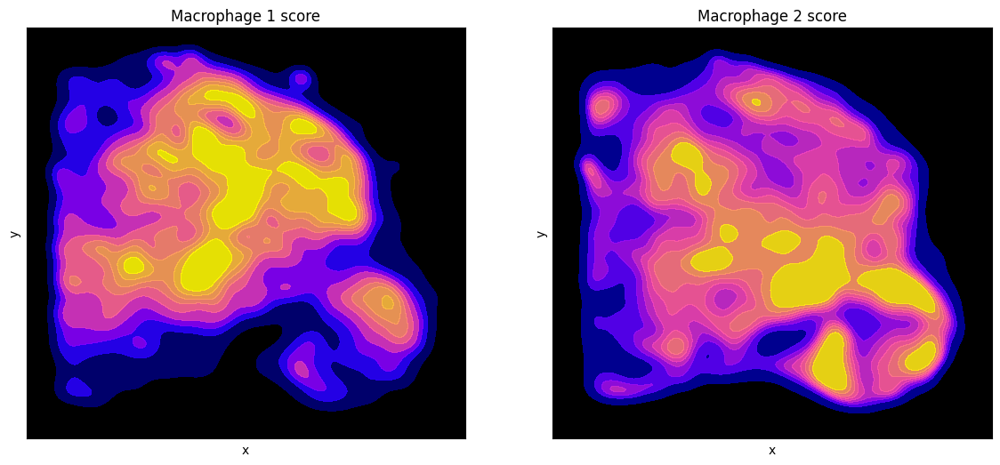

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

fdata_ = fdata[fdata.obs.marker == '2-1']
for i in range(2):

    ax = axs[i]
    ax.set_facecolor('black')

    inter_df = pd.DataFrame({
        'x': fdata_.obsm['spatial'][:, 0],
        'y': fdata_.obsm['spatial'][:, 1],
        'w': fdata_.obs[f'm{i+1}_score'].tolist()
    })

    ax.set_yticks([])
    ax.set_xticks([])
    ax.set_ylabel('y')
    ax.set_xlabel('x')
    ax.grid(True, color='gray')
    ax.set_title(f'Macrophage {str(i+1).upper()} score')

    sns.kdeplot(inter_df, ax=ax, x='x', y='y', weights='w',
        fill=True, cmap='gnuplot2', bw_adjust=0.5, alpha=0.9)
    ax.invert_yaxis()

In [10]:
def mouse_gene(gene_list):
    return [gene[0] + gene[1:].lower() for gene in gene_list]

HYPOXIA = mouse_gene(["ACKR3", "ADM", "ADORA2B", "AK4", "AKAP12", "ALDOA", "ALDOB", "ALDOC", "AMPD3", "ANGPTL4", "ANKZF1", "ANXA2", "ATF3", "ATP7A", "B3GALT6", "B4GALNT2", "BCAN", "BCL2", "BGN", "BHLHE40", "BNIP3L", "BRS3", "BTG1", "CA12", "CASP6", "CAV1", "CAVIN1", "CAVIN3", "CCN1", "CCN2", "CCN5", "CCNG2", "CDKN1A", "CDKN1B", "CDKN1C", "CHST2", "CHST3", "CITED2", "COL5A1", "CP", "CSRP2", "CXCR4", "DCN", "DDIT3", "DDIT4", "DPYSL4", "DTNA", "DUSP1", "EDN2", "EFNA1", "EFNA3", "EGFR", "ENO1", "ENO2", "ENO3", "ERO1A", "ERRFI1", "ETS1", "EXT1", "F3", "FAM162A", "FBP1", "FOS", "FOSL2", "FOXO3", "GAA", "GALK1", "GAPDH", "GAPDHS", "GBE1", "GCK", "GCNT2", "GLRX", "GPC1", "GPC3", "GPC4", "GPI", "GRHPR", "GYS1", "HAS1", "HDLBP", "HEXA", "HK1", "HK2", "HMOX1", "HOXB9", "HS3ST1", "HSPA5", "IDS", "IER3", "IGFBP1", "IGFBP3", "IL6", "ILVBL", "INHA", "IRS2", "ISG20", "JMJD6", "JUN", "KDELR3", "KDM3A", "KIF5A", "KLF6", "KLF7", "KLHL24", "LALBA", "LARGE1", "LDHA", "LDHC", "LOX", "LXN", "MAFF", "MAP3K1", "MIF", "MT1E", "MT2A", "MXI1", "MYH9", "NAGK", "NCAN", "NDRG1", "NDST1", "NDST2", "NEDD4L", "NFIL3", "NOCT", "NR3C1", "P4HA1", "P4HA2", "PAM", "PCK1", "PDGFB", "PDK1", "PDK3", "PFKFB3", "PFKL", "PFKP", "PGAM2", "PGF", "PGK1", "PGM1", "PGM2", "PHKG1", "PIM1", "PKLR", "PKP1", "PLAC8", "PLAUR", "PLIN2", "PNRC1", "PPARGC1A", "PPFIA4", "PPP1R15A", "PPP1R3C", "PRDX5", "PRKCA", "PYGM", "RBPJ", "RORA", "RRAGD", "S100A4", "SAP30", "SCARB1", "SDC2", "SDC3", "SDC4", "SELENBP1", "SERPINE1", "SIAH2", "SLC25A1", "SLC2A1", "SLC2A3", "SLC2A5", "SLC37A4", "SLC6A6", "SRPX", "STBD1", "STC1", "STC2", "SULT2B1", "TES", "TGFB3", "TGFBI", "TGM2", "TIPARP", "TKTL1", "TMEM45A", "TNFAIP3", "TPBG", "TPD52", "TPI1", "TPST2", "UGP2", "VEGFA", "VHL", "VLDLR", "WSB1", "XPNPEP1", "ZFP36", "ZNF292"])

In [11]:
sc.tl.score_genes(fdata, gene_list=HYPOXIA, score_name='hypoxia_score')

In [12]:
fdata.obs.hypoxia_score = [0 if s <= 0 else s for s in fdata.obs.hypoxia_score]

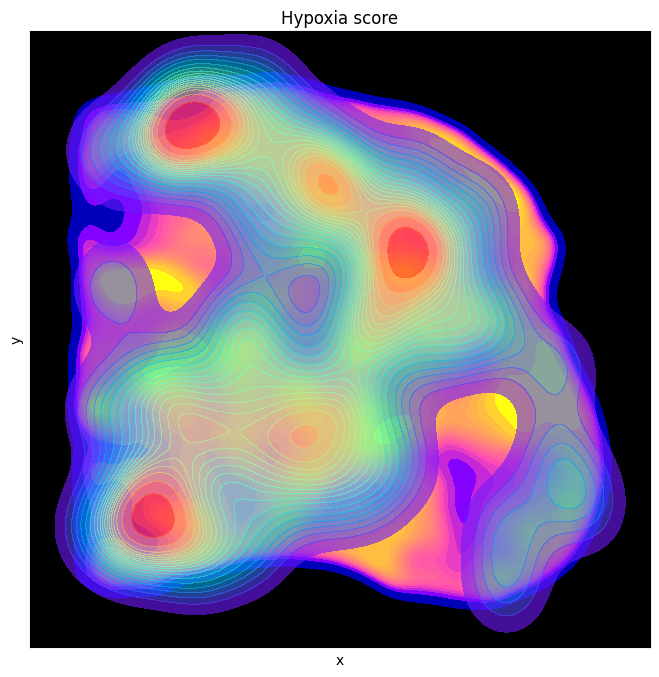

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

fdata_ = fdata[fdata.obs.marker == '2-1']
ax.set_facecolor('black')

inter_df = pd.DataFrame({
    'x': fdata_.obsm['spatial'][:, 0],
    'y': fdata_.obsm['spatial'][:, 1],
    'w': fdata_.obs[f'hypoxia_score'].tolist()
})

ax.set_yticks([])
ax.set_xticks([])
ax.set_ylabel('y')
ax.set_xlabel('x')
ax.grid(True, color='gray')
ax.set_title(f'Hypoxia score')

sns.kdeplot(inter_df, ax=ax, x='x', y='y', weights='w', levels=20,
    fill=True, cmap='gnuplot2', bw_adjust=0.5, alpha=1)

inter_df = pd.DataFrame({
    'x': fdata_.obsm['spatial'][:, 0],
    'y': fdata_.obsm['spatial'][:, 1],
    'w': pdata_[:, 'sgCd44'].X.flatten().tolist()
})

axs[1].set_yticks([])
axs[1].set_xticks([])
axs[1].set_ylabel('y')
axs[1].set_xlabel('x')
axs[1].grid(True, color='gray')
axs[1].set_title(f'sgCd44')
sns.kdeplot(inter_df, ax=ax, x='x', y='y', weights='w', levels=20,
    fill=True, cmap='rainbow', bw_adjust=0.5, alpha=0.6)
# pdata = gdata.copy()
# pdata[:, ['sgCd44', 'sgnon-targeting']].X = pdata[:, ['sgCd44', 'sgnon-targeting']].X * 10
# utils.plot_dot(pdata[pdata.obs.marker == '2-1'], gene_name='sgCd44', square=False, color='White', ax=ax, alpha=1)
# utils.plot_dot(pdata[pdata.obs.marker == '2-1'], gene_name='sgnon-targeting', square=False, color='Yellow', ax=ax, alpha=1)
ax.invert_yaxis()

# legend = ax.legend(loc='upper left', title='')
# legend.get_frame().set_facecolor('black')
# plt.setp(legend.get_texts(), color='white')

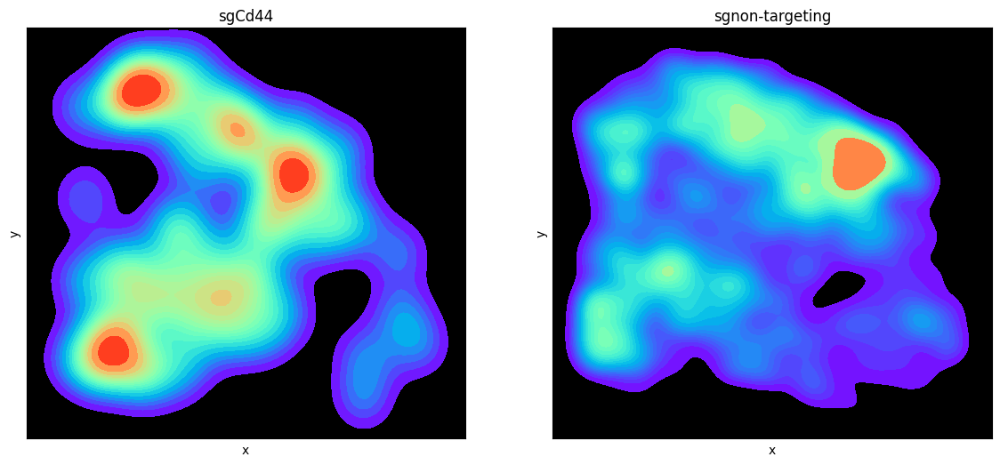

In [30]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

pdata = gdata.copy()
pdata[:, ['sgCd44', 'sgnon-targeting']].X = pdata[:, ['sgCd44', 'sgnon-targeting']].X * 10
pdata_ = pdata[pdata.obs.marker == '2-1']

axs[0].set_facecolor('black')

inter_df = pd.DataFrame({
    'x': fdata_.obsm['spatial'][:, 0],
    'y': fdata_.obsm['spatial'][:, 1],
    'w': pdata_[:, 'sgCd44'].X.flatten().tolist()
})

axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].set_ylabel('y')
axs[0].set_xlabel('x')
axs[0].grid(True, color='gray')
axs[0].set_title(f'sgCd44')

sns.kdeplot(inter_df, ax=axs[0], x='x', y='y', weights='w', levels=20,
    fill=True, cmap='rainbow', bw_adjust=0.5, alpha=1)
axs[0].invert_yaxis()

axs[1].set_facecolor('black')

inter_df = pd.DataFrame({
    'x': fdata_.obsm['spatial'][:, 0],
    'y': fdata_.obsm['spatial'][:, 1],
    'w': pdata_[:, 'sgnon-targeting'].X.flatten().tolist()
})

axs[1].set_yticks([])
axs[1].set_xticks([])
axs[1].set_ylabel('y')
axs[1].set_xlabel('x')
axs[1].grid(True, color='gray')
axs[1].set_title(f'sgnon-targeting')

sns.kdeplot(inter_df, ax=axs[1], x='x', y='y', weights='w', levels=20,
    fill=True, cmap='rainbow', bw_adjust=0.5, alpha=1)
axs[1].invert_yaxis()

# APC

In [34]:
apc_signature_genes = ["Ptprc", "Cd14", "Itgam", "Itgax", "Trem2", "Fcgr4", "Ccr2", "Cd163", "Cd68", "Arg1", \
    "Adgre1", "Cd33", "Cd68", "C1qa", "Cd163",  "C1qb", "C1qc",  "Marco", "Cd81", "Ptprc", "Itgam", "Itgax", "Cd14", "Cd33", "Cd68", "Cd93", "Cd209d", "Ccl22", "Cd86", "Clec9a", "Clec10a", "Xcr1", "Lamp3"]

In [37]:
fdata_ = fdata[fdata.obs.marker == '2-1'].copy()

In [38]:
sc.tl.score_genes(fdata_, gene_list=apc_signature_genes, score_name='APC_score')

In [39]:
fdata_.obs.APC_score = [s if s > 0 else 0 for s in fdata_.obs.APC_score]

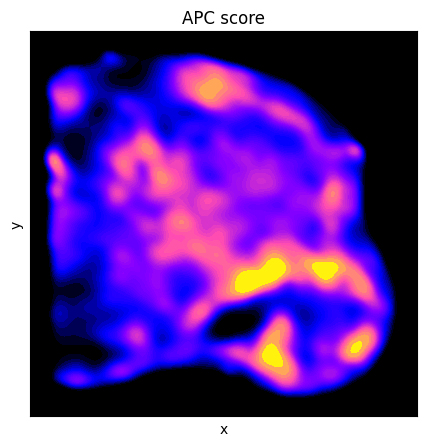

In [106]:
df = pd.DataFrame({
    'coord_x': fdata_.obsm['spatial'][:, 0],
    'coord_y': fdata_.obsm['spatial'][:, 1],
    'APC_score': fdata_.obs['APC_score'].tolist()
})

_, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.set_facecolor('black')

ax.set_yticks([])
ax.set_xticks([])
ax.set_ylabel('y')
ax.set_xlabel('x')
ax.grid(True, color='gray')
ax.set_title(f'APC score')
    
sns.kdeplot(df, x='coord_x', y='coord_y', weights='APC_score', cmap='gnuplot2', fill=True, bw_adjust=0.4, levels=40)
ax.invert_yaxis()

# Fibroblast

In [107]:
sc.tl.score_genes(fdata, gene_list=['Col1a1', 'Col1a2', 'Col3a1'], score_name='Stiffness_Score')

In [108]:
threshold = np.apply_along_axis(lambda x: np.quantile(np.array(fdata.obs['Stiffness_Score']), x), 0, np.linspace(0.5, 0.995, 50))
threshold

array([0.14004952, 0.15118593, 0.16256688, 0.17436639, 0.18597327,
       0.19786366, 0.21055004, 0.22342869, 0.23671985, 0.25039744,
       0.26554649, 0.27957991, 0.29533726, 0.31108443, 0.32750174,
       0.34329611, 0.36076353, 0.37886452, 0.39685724, 0.41674336,
       0.43596195, 0.45754401, 0.47878649, 0.50094352, 0.5228513 ,
       0.54660147, 0.57076324, 0.59728253, 0.62375113, 0.65240299,
       0.68150749, 0.71367303, 0.75003187, 0.78851384, 0.82766071,
       0.87312939, 0.92112009, 0.96895665, 1.02348241, 1.08663374,
       1.15508449, 1.23388518, 1.32787898, 1.44502704, 1.57311424,
       1.7476242 , 1.97691828, 2.32683713, 2.89120066, 4.34298445])

In [112]:
from tqdm import tqdm
proportion_bin = {}
for marker in gdata.obs.marker.unique():
    proportion_bin[marker] = {}
    gdata_ = gdata[gdata.obs.marker == marker]
    fdata_ = fdata[fdata.obs.marker == marker]
    for th in tqdm(threshold):
        proportion_bin[marker][th] = []
        for guide in gdata_.var_names:
            proportion = gdata_[fdata_.obs['Stiffness_Score'] >= th, guide].X.sum() / gdata_[:, guide].X.sum()
            proportion_bin[marker][th].append(proportion)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:05<00:00,  8.38it/s]


In [117]:
pdf = pd.DataFrame(columns=['guide', 'threshold', 'proportion'])
for marker in gdata.obs.marker.unique():
    df = pd.DataFrame(proportion_bin[marker], index=gdata.var_names).melt(ignore_index=False).reset_index()
    df.columns = ['guide', 'threshold', 'proportion']
    df['marker'] = marker
    pdf = pd.concat([pdf, df])

,guide,threshold,proportion,marker
0,sgAdrb2,0.140050,0.398907,1-1
1,sgAqp3,0.140050,0.314516,1-1
2,sgArntl,0.140050,0.362187,1-1
3,sgCd44,0.140050,0.349398,1-1
4,sgCd52,0.140050,0.350983,1-1
...,...,...,...,...
1695,sgWipf1,4.342984,0.004854,3-2
1696,sgZc3h12a,4.342984,0.001374,3-2
1697,sgZhx2,4.342984,0.003067,3-2
1698,sgZscan12,4.342984,0.004098,3-2


ValueError: cannot reindex on an axis with duplicate labels

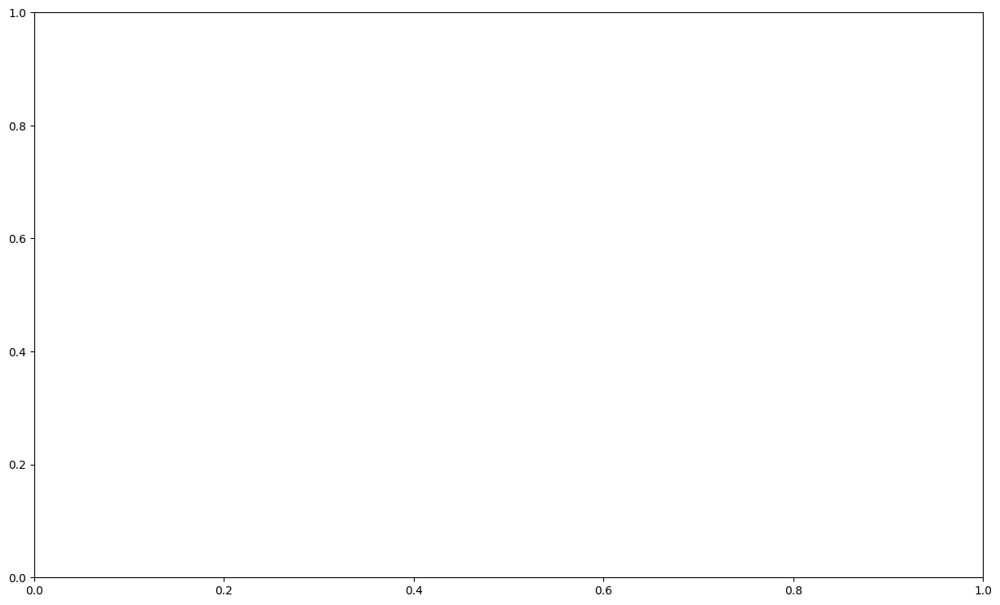

In [169]:
plt.figure(figsize=(15, 9))
gdf = pdf[['guide', 'threshold', 'proportion', 'marker']]
gdf.threshold = gdf.threshold.astype(float)
gdf.guide = gdf.guide.astype('category')
gdf.marker = gdf.marker.astype('category')
sns.lineplot(gdf[gdf['guide'].str.startswith('sgCd44')], x='threshold', y='proportion', hue='guide', palette='Reds', alpha=1)
sns.barplot(gdf[~gdf['guide'].str.startswith('sgCd44')], x='threshold', y='proportion', hue='guide', palette='rainbow', alpha=0.1)
plt.xlabel('Distance Theshold')
plt.ylabel('Proportion of Guide within distance')
plt.legend(title='guide', loc='upper right', bbox_to_anchor=(1, 1), ncols=3)
plt.title('Guide distrbution in Stiff Region')

In [48]:
fib_data = fdata_.copy()

In [52]:
gdata_ = gdata[gdata.obs.marker == '2-1'].copy()

In [56]:
sc.tl.score_genes(fdata_, gene_list=['Col1a1', 'Col1a2', 'Col3a1'], score_name='Stiffness Score')

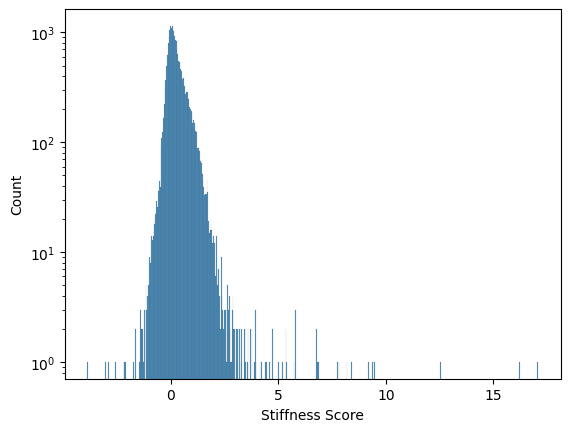

In [62]:
sns.histplot(fdata_.obs['Stiffness Score'])
plt.gca().set_yscale('log')

In [74]:
threshold = np.apply_along_axis(lambda x: np.quantile(np.array(fdata_.obs['Stiffness Score']), x), 0, np.linspace(0.5, 0.995, 50))
threshold

array([0.16635354, 0.17625981, 0.18599281, 0.19608616, 0.20614171,
       0.21617462, 0.22659297, 0.23763445, 0.24715703, 0.25727675,
       0.26744833, 0.27955282, 0.2925315 , 0.30444845, 0.31714524,
       0.33316797, 0.34765541, 0.36383979, 0.37921122, 0.39494818,
       0.41196713, 0.42690722, 0.44434035, 0.46239697, 0.48160199,
       0.5005814 , 0.52050064, 0.54275054, 0.56555497, 0.5880229 ,
       0.61092091, 0.63835611, 0.66510544, 0.69472717, 0.72395413,
       0.75573967, 0.78709053, 0.8201431 , 0.85540584, 0.89605085,
       0.94018678, 0.98413417, 1.04006617, 1.09563708, 1.15921988,
       1.23386383, 1.33190974, 1.45463603, 1.67635016, 2.25731063])

In [79]:
proportion_bin = {}
for th in threshold:
    proportion_bin[th] = []
    for guide in gdata_.var_names:
        proportion = gdata_[fdata_.obs['Stiffness Score'] >= th, guide].X.sum() / gdata_[:, guide].X.sum()
        proportion_bin[th].append(proportion)

In [82]:
df = pd.DataFrame(proportion_bin, index=gdata.var_names)

In [85]:
d_df = df.melt(ignore_index=False).reset_index()
d_df

,index,variable,value
0,sgAdrb2,0.166354,0.421941
1,sgAqp3,0.166354,0.445269
2,sgArntl,0.166354,0.418994
3,sgCd44,0.166354,0.451613
4,sgCd52,0.166354,0.426396
...,...,...,...
1695,sgWipf1,2.257311,0.000000
1696,sgZc3h12a,2.257311,0.000639
1697,sgZhx2,2.257311,0.000000
1698,sgZscan12,2.257311,0.002028


Text(0.5, 1.0, 'Guide distrbution in Stiff Region')

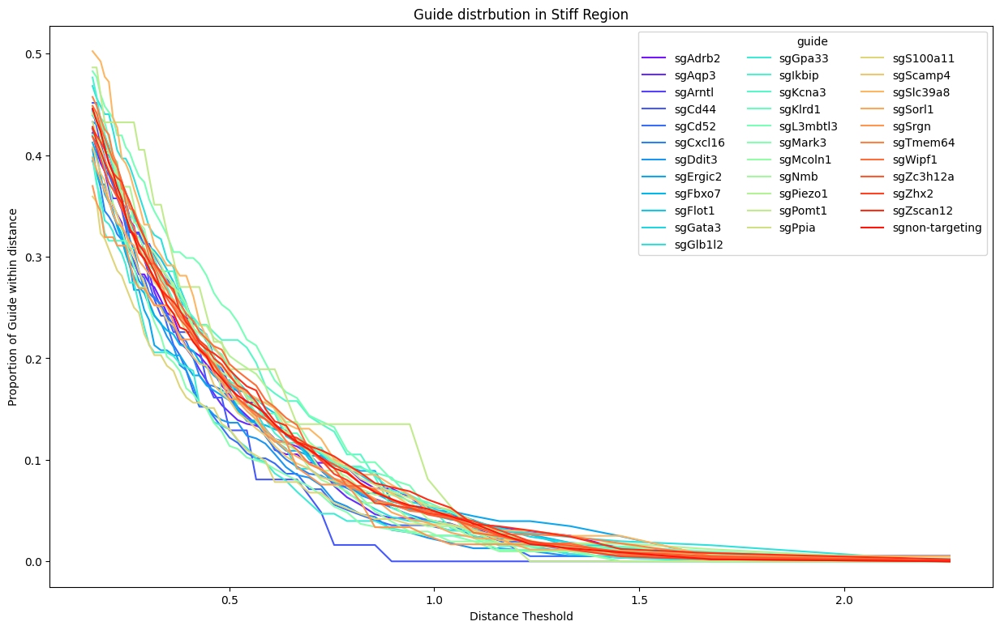

In [145]:
plt.figure(figsize=(15, 9))
sns.lineplot(d_df, x='variable', y='value', hue='index', palette='rainbow', alpha=1)
# sns.lineplot(d_df[~d_df['index'].str.startswith('sgCd44')], x='variable', y='value', hue='index', palette='rainbow', alpha=0.1)
plt.xlabel('Distance Theshold')
plt.ylabel('Proportion of Guide within distance')
plt.legend(title='guide', loc='upper right', bbox_to_anchor=(1, 1), ncols=3)
plt.title('Guide distrbution in Stiff Region')

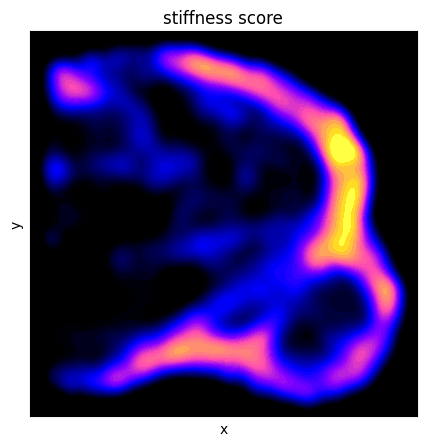

In [105]:
fdata_.obs['Stiffness Score'] = [s if s > 0 else 0 for s in fdata_.obs['Stiffness Score']]
df = pd.DataFrame({
    'coord_x': fdata_.obsm['spatial'][:, 0],
    'coord_y': fdata_.obsm['spatial'][:, 1],
    'APC_score': fdata_.obs['Stiffness Score'].tolist()
})

_, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.set_facecolor('black')

ax.set_yticks([])
ax.set_xticks([])
ax.set_ylabel('y')
ax.set_xlabel('x')
ax.grid(True, color='gray')
ax.set_title(f'stiffness score')

sns.kdeplot(df, x='coord_x', y='coord_y', weights='APC_score', cmap='gnuplot2', fill=True, bw_adjust=0.4, levels=40)
ax.invert_yaxis()